In [1]:
import pandas as pd 
import numpy as np 
import scipy as sp
import matplotlib.pyplot as plt 
import seaborn as sns
from scipy import stats
from scipy.stats import shapiro
from scipy.stats import boxcox

In [3]:
df = pd.read_excel("yok_karne_0307.xlsx")

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)


# Veri Ön İnceleme

In [3]:
df.head(5)

,Üniversite/Gosterge,A.1 Mezun olan doktora öğrenci sayısı,A.2.1 Kamu Personel Seçme Sınavlarında (KPSS) ilk %5’lik dilime giren program sayısı,A.2.2 Akademik Personel ve Lisansüstü Egitimi Giris Sınavlarında (ALES) ilk %5’lik dilime giren program sayısı,"A.3 Uluslararası sempozyum, kongre veya sanatsal sergi sayısı",A.4.1 Öğrencilerin yaptığı sosyal sorumluluk projelerinin sayısı,A.4.2 Öğrencilerin yaptığı endüstriyel projelerin sayısı,A.5 Teknokent veya Teknoloji Transfer Ofisi (TTO) projelerine katılan öğrenci sayısı,A.6 Programların genel doluluk oranı,A.7 Erişilebilen ders bilgi paketi oranı,...,D.2 Sürekli Eğitim Merkezi ve Dil Merkezi tarafından verilen sertifika sayısı,D.3 Kariyer Merkezi çalışmaları kapsamında öğrenci ve mezunlara yönelik gerçekleştirilen faaliyet sayısı,D.4 Kamu kurumları ile birlikte yürütülen proje sayısı,D.5.1 Dezavantajlı gruplara yönelik sosyal entegrasyon ve kapsayıcılığa ilişkin yapılan faaliyet sayısı,"D.5.2 Üniversitenin engelsiz üniversite ödülü, engelsiz bayrak ödülü, engelsiz program nişanı ve engelli dostu ödülü sayısı","D.6.1 Üniversitenin sıfır atık, yeşil kampüs ve çevrecilik alanlarında aldığı ödül sayısı","D.6.2 Üniversitenin yeşil, çevreci üniversite endeksindeki sıralaması",D.7 Üniversiteye kazandırılan bağış miktarı,D.8 Öğrenci başına yapılan harcama miktarı,D.9 Üniversitenin sağladığı eğitim burslarından faydalanan öğrenci oranı
0,abdullah-gul-universitesi.pdf,4,0,3,39,19.0,107,500.0,1.000,0.983,...,334.0,30,19,26,0,0,2500,805718,26689.0,0.158
1,acibadem-mehmet-ali-aydinlar-universitesi.pdf,8,0,0,19,30.0,19,0.0,0.940,1.000,...,2100.0,39,43,25,0,0,2500,118930355,35975.0,0.350
2,adana-alparslan-turkes-bilim-ve-teknoloji-univ...,0,0,0,9,1.0,0,35.0,0.830,1.000,...,104.0,23,6,12,0,0,2500,0,20553.0,0.145
3,adiyaman-universitesi.pdf,7,3,4,0,3.0,1,1.0,0.880,1.000,...,987.0,180,2,2,9,6,567,18375,12470.0,0.010
4,afyon-kocatepe-universitesi.pdf,29,2,4,4,2.0,2,0.0,0.792,0.497,...,565.0,24,5,3,15,0,344,11969,9128.0,0.009


In [4]:
df=df.rename(columns={"A.1 Mezun olan doktora öğrenci sayısı":"A.1",
                      "A.2.1 Kamu Personel Seçme Sınavlarında (KPSS) ilk %5’lik dilime giren program sayısı":"A.2.1",
                     "A.2.2 Akademik Personel ve Lisansüstü Egitimi Giris Sınavlarında (ALES) ilk %5’lik dilime giren program sayısı":"A.2.2",
                     "A.3 Uluslararası sempozyum, kongre veya sanatsal sergi sayısı":"A.3",
                     "A.4.1 Öğrencilerin yaptığı sosyal sorumluluk projelerinin sayısı":"A.4.1",
                     "A.4.2 Öğrencilerin yaptığı endüstriyel projelerin sayısı":"A.4.2",
                     "A.5 Teknokent veya Teknoloji Transfer Ofisi (TTO) projelerine katılan öğrenci sayısı":"A.5",
                     "A.6 Programların genel doluluk oranı":"A.6",
                     "A.7 Erişilebilen ders bilgi paketi oranı":"A.7",
                     "A.8 Mezun takip sistemi içerisindeki mezunların oranı":"A.8",
                     "A.9 Öğrencilerin kayıtlı oldukları program dışındaki diğer programlardan alabildikleri ders oranı":"A.9",
                     "A.10 Yükseköğretim Kurumları Sınavı (YKS) kılavuzunda akredite olduğu belirtilen lisans programı sayısı":"A.10",
                     "A.11.1 Üniversite kütüphanesinde öğrenci başına düşen basılı kitap sayısı":"A.11.1",
                     "A.11.2 Üniversite kütüphanesinde öğrenci başına düşen e-yayın sayısı":"A.11.2",
                     "B.1 Ulusal hakemli dergilerde yayımlanmış öğretim elemanı başına düşen yayın sayısı":"B.1",
                     "B.2 SCI, SCI-Expanded, SSCI ve AHCI endeksli dergilerde yayımlanmış öğretim elemanı başına düşen yayın sayısı":"B.2",
                     "B.3 En yüksek %10’luk dilimde atıf alan yayın sayısı":"B.3",
                     "B.4 Üniversite adresli bilimsel yayınlara açık erişim oranı":"B.4",
                     "B.5.1 Başvurulan patent, faydalı model veya tasarım sayısı":"B.5.1",
                     "B.5.2 Sonuçlanan patent, faydalı model veya tasarım sayısı":"B.5.2",
                     "B.6 YÖK, TÜBA, TÜBİTAK bilim, teşvik ve sanat ödülleri sayısı":"B.6",
                     "B.7  YÖK 100/2000 Projesi doktora bursiyeri sayısı":"B.7",
                     "B.8 YÖK-YUDAB bursiyeri sayısı":"B.8",
                     "B.9 TÜBİTAK tarafından verilen ulusal ve uluslararası araştırma bursu sayısı":"B.9",
                     "B.10 TÜBİTAK tarafından verilen ulusal ve uluslararası destek programı sayısı":"B.10",
                     "B.11 Ulusal ve uluslararası özel veya resmi kurum ve kuruluşlar tarafından desteklenmiş Ar- Ge niteliği taşıyan proje sayısı":"B.11",
                     "B.12.1 Üniversitenin THE’ya göre dünya sıralaması":"B.12.1",
                     "B.12.2 Üniversitenin THE’ya göre bölgesel (Asya) sıralaması":"B.12.2",
                     "B.12.3 Üniversitenin THE’ya göre ulusal sıralaması":"B.12.3",
                     "B.12.4 Üniversitenin QS’e göre dünya sıralaması":"B.12.4",
                     "B.12.5 Üniversitenin QS’e göre bölgesel (Asya) sıralaması":"B.12.5",
                     "B.12.7 Üniversitenin ARWU’ya göre dünya sıralaması":"B.12.7",
                     "B.12.8 Üniversitenin ARWU’ya göre ulusal sıralaması":"B.12.8",
                     "B.13 Teknoloji Geliştirme Bölgelerinde (TGB) istihdam edilen doktora programlarına kayıtlı öğrenci sayısı":"B.13",
                     "B.14.1 Üniversite laboratuvarlarında Ar-Ge, inovasyon ve ürün geliştirme kapsamında sunulan hizmet sayısı":"B.14.1",
                     "B.14.2 Üniversite laboratuvarlarında Ar-Ge inovasyon ve ürün gelistirme kapsamında sunulan hizmetlerden elde edilen gelir":"B.14.2",
                     "B.15 Merkezi bütçe dışı öz gelir, döner sermaye, fon vb. gelirlerin yıllık bütçeye oranı":"B.15",
                     "B.16 Sağlık Uygulama ve Araştırma Merkezinin kâr ya da zararının toplam ciroya oranı":"B.16",
                     "B.17.1 Ar-Ge’ye harcanan bütçe oranı":"B.17.1",
                     "B.17.2 Ar-Ge’ye harcanan yatırım bütçesi oranı":"B.17.2",
                     "B.18.1 Endüstri ile ortak yürütülen proje sayısı":"B.18.1",
                     "B.18.2 Endüstri ile ortak yürütülen projelerin toplam bütçesi":"B.18.2",
                     "B.19 Yayın alımının bütçeye oranı":"B.19",
                     "C.1.1 İstihdam edilen yabancı uyruklu öğretim üyesi sayısı":"C.1.1",
                     "C.1.2 İstihdam edilen yabancı uyruklu doktoralı öğretim görevlisi ve araştırmacı sayısı":"C.1.2",
                     "C.2 Üniversitedeki yabancı uyruklu öğrenci sayısı":"C.2",
                     "C.3.1 Uluslararası değişim programları kapsamında gelen öğretim elemanı sayısı":"C.3.1",
                     "C.3.2 Uluslararası değişim programları kapsamında gönderilen öğretim elemanı sayısı":"C.3.2",
                     "C.4.1 Uluslararası değişim programları kapsamında gelen öğrenci sayısı":"C.4.1",
                     "C.4.2 Uluslararası değişim programları kapsamında gönderilen öğrenci sayısı":"C.4.2",
                     "C.5 Üniversite öğretim elemanlarının aldığı uluslararası fonlara dayalı proje sayısı":"C.5",
                     "C.6 Yurt dışındaki üniversiteler veya kurum ve kuruluşlar ile ortak yürütülen proje sayısı":"C.6",
                     "D.1 Üniversitenin yaptığı sosyal sorumluluk projesi sayısı":"D.1",
                     "D.2 Sürekli Eğitim Merkezi ve Dil Merkezi tarafından verilen sertifika sayısı":"D.2",
                     "D.3 Kariyer Merkezi çalışmaları kapsamında öğrenci ve mezunlara yönelik gerçekleştirilen faaliyet sayısı":"D.3",
                     "D.4 Kamu kurumları ile birlikte yürütülen proje sayısı":"D.4",
                     "D.5.1 Dezavantajlı gruplara yönelik sosyal entegrasyon ve kapsayıcılığa ilişkin yapılan faaliyet sayısı":"D.5.1",
                     "D.5.2 Üniversitenin engelsiz üniversite ödülü, engelsiz bayrak ödülü, engelsiz program nişanı ve engelli dostu ödülü sayısı":"D.5.2",
                     "D.6.1 Üniversitenin sıfır atık, yeşil kampüs ve çevrecilik alanlarında aldığı ödül sayısı":"D.6.1",
                     "D.6.2 Üniversitenin yeşil, çevreci üniversite endeksindeki sıralaması":"D.6.2",
                     "D.7 Üniversiteye kazandırılan bağış miktarı":"D.7",
                     "D.8 Öğrenci başına yapılan harcama miktarı":"D.8",
                     "D.9 Üniversitenin sağladığı eğitim burslarından faydalanan öğrenci oranı":"D.9",})
df.head(5)

,Üniversite/Gosterge,A.1,A.2.1,A.2.2,A.3,A.4.1,A.4.2,A.5,A.6,A.7,...,D.2,D.3,D.4,D.5.1,D.5.2,D.6.1,D.6.2,D.7,D.8,D.9
0,abdullah-gul-universitesi.pdf,4,0,3,39,19.0,107,500.0,1.000,0.983,...,334.0,30,19,26,0,0,2500,805718,26689.0,0.158
1,acibadem-mehmet-ali-aydinlar-universitesi.pdf,8,0,0,19,30.0,19,0.0,0.940,1.000,...,2100.0,39,43,25,0,0,2500,118930355,35975.0,0.350
2,adana-alparslan-turkes-bilim-ve-teknoloji-univ...,0,0,0,9,1.0,0,35.0,0.830,1.000,...,104.0,23,6,12,0,0,2500,0,20553.0,0.145
3,adiyaman-universitesi.pdf,7,3,4,0,3.0,1,1.0,0.880,1.000,...,987.0,180,2,2,9,6,567,18375,12470.0,0.010
4,afyon-kocatepe-universitesi.pdf,29,2,4,4,2.0,2,0.0,0.792,0.497,...,565.0,24,5,3,15,0,344,11969,9128.0,0.009


In [86]:
df.info(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199 entries, 0 to 198
Data columns (total 64 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Üniversite/Gosterge  199 non-null    object 
 1   A.1                  199 non-null    int64  
 2   A.2.1                199 non-null    int64  
 3   A.2.2                199 non-null    int64  
 4   A.3                  199 non-null    int64  
 5   A.4.1                199 non-null    float64
 6   A.4.2                199 non-null    int64  
 7   A.5                  199 non-null    float64
 8   A.6                  199 non-null    float64
 9   A.7                  199 non-null    float64
 10  A.8                  199 non-null    float64
 11  A.9                  199 non-null    float64
 12  A.10                 199 non-null    int64  
 13  A.11.1               199 non-null    float64
 14  A.11.2               199 non-null    float64
 15  B.1                  199 non-null    flo

In [6]:
df.shape

(199, 64)

In [248]:
df.describe()

,A.1,A.2.1,A.2.2,A.3,A.4.1,A.4.2,A.5,A.6,A.7,A.8,...,D.2,D.3,D.4,D.5.1,D.5.2,D.6.1,D.6.2,D.7,D.8,D.9
count,199.000000,199.000000,199.000000,199.000000,199.000000,199.000000,199.000000,199.000000,199.000000,199.000000,...,199.000000,199.00000,199.000000,199.000000,199.000000,199.000000,199.000000,1.990000e+02,199.000000,199.000000
mean,44.296482,2.437186,2.693467,17.346734,60.870156,40.306533,65.413578,0.714633,0.642854,0.360553,...,2807.677688,58.21608,21.949749,43.010050,2.648241,0.522613,1795.954774,9.609775e+06,18240.377407,0.089497
std,80.258028,4.820497,5.410568,27.802249,124.603155,103.395736,138.241431,0.351270,0.444694,0.397264,...,6513.432572,185.46210,56.328290,178.116946,6.532505,1.675203,969.192225,3.996311e+07,14989.794875,0.149583
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000e+00,0.000000,0.000000
25%,1.000000,0.000000,0.000000,3.000000,5.000000,0.000000,0.000000,0.731000,0.010000,0.008500,...,102.000000,7.00000,1.000000,1.000000,0.000000,0.000000,673.500000,0.000000e+00,10292.000000,0.000000
50%,13.000000,0.000000,0.000000,7.000000,19.000000,4.000000,3.000000,0.862000,0.950000,0.145000,...,565.000000,19.00000,6.000000,8.000000,0.000000,0.000000,2500.000000,2.389680e+05,14789.000000,0.021000
75%,46.000000,3.000000,3.000000,19.000000,52.000000,28.500000,44.500000,0.946500,1.000000,0.790000,...,2336.500000,45.50000,20.500000,21.000000,2.500000,0.000000,2500.000000,2.372381e+06,21147.500000,0.109000
max,508.000000,27.000000,32.000000,204.000000,881.000000,894.000000,879.000000,1.000000,1.000000,1.000000,...,60223.000000,2105.00000,574.000000,1615.000000,71.000000,15.000000,2500.000000,4.701790e+08,103319.000000,1.000000


In [249]:
carpiklik=[]
basiklik=[]
Shapiro=[]
carpiklik.append(stats.skew(df["A.1"]))
carpiklik.append(stats.skew(df["A.2.1"]))
carpiklik.append(stats.skew(df["A.2.2"]))
carpiklik.append(stats.skew(df["A.3"]))
carpiklik.append(stats.skew(df["A.4.1"]))
carpiklik.append(stats.skew(df["A.4.2"]))
carpiklik.append(stats.skew(df["A.5"]))
carpiklik.append(stats.skew(df["A.6"]))
carpiklik.append(stats.skew(df["A.7"]))
carpiklik.append(stats.skew(df["A.8"]))
carpiklik.append(stats.skew(df["A.9"]))
carpiklik.append(stats.skew(df["A.10"]))
carpiklik.append(stats.skew(df["A.11.1"]))
carpiklik.append(stats.skew(df["A.11.2"]))
carpiklik.append(stats.skew(df["B.1"]))
carpiklik.append(stats.skew(df["B.2"]))
carpiklik.append(stats.skew(df["B.3"]))
carpiklik.append(stats.skew(df["B.4"]))
carpiklik.append(stats.skew(df["B.5.1"]))
carpiklik.append(stats.skew(df["B.5.2"]))
carpiklik.append(stats.skew(df["B.6"]))
carpiklik.append(stats.skew(df["B.7"]))
#B.8 değişkenindeki tüm gözlemeler 0 içerdiğinden bir fayda saylamaz.
carpiklik.append(stats.skew(df["B.9"]))
carpiklik.append(stats.skew(df["B.10"]))
carpiklik.append(stats.skew(df["B.11"]))
#B.12.1,B.12.2,B.12.3,B.12.4,B.12.7,B.12.8 kategorik değişkenler olduğundan çarpıklık katsayısı hesaplanmadı.
carpiklik.append(stats.skew(df["B.13"]))
carpiklik.append(stats.skew(df["B.14.1"]))
carpiklik.append(stats.skew(df["B.15"]))
carpiklik.append(stats.skew(df["B.16"]))
carpiklik.append(stats.skew(df["B.17.1"]))
carpiklik.append(stats.skew(df["B.17.2"]))
carpiklik.append(stats.skew(df["B.18.1"]))
carpiklik.append(stats.skew(df["B.18.2"]))
carpiklik.append(stats.skew(df["B.19"]))
carpiklik.append(stats.skew(df["C.1.1"]))
carpiklik.append(stats.skew(df["C.1.2"]))
carpiklik.append(stats.skew(df["C.2"]))
carpiklik.append(stats.skew(df["C.3.1"]))
carpiklik.append(stats.skew(df["C.3.2"]))
carpiklik.append(stats.skew(df["C.4.1"]))
carpiklik.append(stats.skew(df["C.4.2"]))
carpiklik.append(stats.skew(df["C.5"]))
carpiklik.append(stats.skew(df["C.6"]))
carpiklik.append(stats.skew(df["D.1"]))
carpiklik.append(stats.skew(df["D.2"]))
carpiklik.append(stats.skew(df["D.3"]))
carpiklik.append(stats.skew(df["D.4"]))
carpiklik.append(stats.skew(df["D.5.1"]))
carpiklik.append(stats.skew(df["D.5.2"]))
carpiklik.append(stats.skew(df["D.6.1"]))
carpiklik.append(stats.skew(df["D.6.2"]))
carpiklik.append(stats.skew(df["D.7"]))
carpiklik.append(stats.skew(df["D.8"]))
carpiklik.append(stats.skew(df["D.9"]))
#Basıklık değerleri 
basiklik.append(stats.kurtosis(df["A.1"]))
basiklik.append(stats.kurtosis(df["A.2.1"]))
basiklik.append(stats.kurtosis(df["A.2.2"]))
basiklik.append(stats.kurtosis(df["A.3"]))
basiklik.append(stats.kurtosis(df["A.4.1"]))
basiklik.append(stats.kurtosis(df["A.4.2"]))
basiklik.append(stats.kurtosis(df["A.5"]))
basiklik.append(stats.kurtosis(df["A.6"]))
basiklik.append(stats.kurtosis(df["A.7"]))
basiklik.append(stats.kurtosis(df["A.8"]))
basiklik.append(stats.kurtosis(df["A.9"]))
basiklik.append(stats.kurtosis(df["A.10"]))
basiklik.append(stats.kurtosis(df["A.11.1"]))
basiklik.append(stats.kurtosis(df["A.11.2"]))
basiklik.append(stats.kurtosis(df["B.1"]))
basiklik.append(stats.kurtosis(df["B.2"]))
basiklik.append(stats.kurtosis(df["B.3"]))
basiklik.append(stats.kurtosis(df["B.4"]))
basiklik.append(stats.kurtosis(df["B.5.1"]))
basiklik.append(stats.kurtosis(df["B.5.2"]))
basiklik.append(stats.kurtosis(df["B.6"]))
basiklik.append(stats.kurtosis(df["B.7"]))
basiklik.append(stats.kurtosis(df["B.9"]))
basiklik.append(stats.kurtosis(df["B.10"]))
basiklik.append(stats.kurtosis(df["B.11"]))
basiklik.append(stats.kurtosis(df["B.13"]))
basiklik.append(stats.kurtosis(df["B.14.1"]))
basiklik.append(stats.kurtosis(df["B.15"]))
basiklik.append(stats.kurtosis(df["B.16"]))
basiklik.append(stats.kurtosis(df["B.17.1"]))
basiklik.append(stats.kurtosis(df["B.17.2"]))
basiklik.append(stats.kurtosis(df["B.18.1"]))
basiklik.append(stats.kurtosis(df["B.18.2"]))
basiklik.append(stats.kurtosis(df["B.19"]))
basiklik.append(stats.kurtosis(df["C.1.1"]))
basiklik.append(stats.kurtosis(df["C.1.2"]))
basiklik.append(stats.kurtosis(df["C.2"]))
basiklik.append(stats.kurtosis(df["C.3.1"]))
basiklik.append(stats.kurtosis(df["C.3.2"]))
basiklik.append(stats.kurtosis(df["C.4.1"]))
basiklik.append(stats.kurtosis(df["C.4.2"]))
basiklik.append(stats.kurtosis(df["C.5"]))
basiklik.append(stats.kurtosis(df["C.6"]))
basiklik.append(stats.kurtosis(df["D.1"]))
basiklik.append(stats.kurtosis(df["D.2"]))
basiklik.append(stats.kurtosis(df["D.3"]))
basiklik.append(stats.kurtosis(df["D.4"]))
basiklik.append(stats.kurtosis(df["D.5.1"]))
basiklik.append(stats.kurtosis(df["D.5.2"]))
basiklik.append(stats.kurtosis(df["D.6.1"]))
basiklik.append(stats.kurtosis(df["D.6.2"]))
basiklik.append(stats.kurtosis(df["D.7"]))
basiklik.append(stats.kurtosis(df["D.8"]))
basiklik.append(stats.kurtosis(df["D.9"]))
#Shapiro-Wilk Testi ve P_Değeri
Shapiro.append(shapiro(df["A.1"]))
Shapiro.append(shapiro(df["A.2.1"]))
Shapiro.append(shapiro(df["A.2.2"]))
Shapiro.append(shapiro(df["A.3"]))
Shapiro.append(shapiro(df["A.4.1"]))
Shapiro.append(shapiro(df["A.4.2"]))
Shapiro.append(shapiro(df["A.5"]))
Shapiro.append(shapiro(df["A.6"]))
Shapiro.append(shapiro(df["A.7"]))
Shapiro.append(shapiro(df["A.8"]))
Shapiro.append(shapiro(df["A.9"]))
Shapiro.append(shapiro(df["A.10"]))
Shapiro.append(shapiro(df["A.11.1"]))
Shapiro.append(shapiro(df["A.11.2"]))
Shapiro.append(shapiro(df["B.1"]))
Shapiro.append(shapiro(df["B.2"]))
Shapiro.append(shapiro(df["B.3"]))
Shapiro.append(shapiro(df["B.4"]))
Shapiro.append(shapiro(df["B.5.1"]))
Shapiro.append(shapiro(df["B.5.2"]))
Shapiro.append(shapiro(df["B.6"]))
Shapiro.append(shapiro(df["B.7"]))
Shapiro.append(shapiro(df["B.9"]))
Shapiro.append(shapiro(df["B.10"]))
Shapiro.append(shapiro(df["B.11"]))
Shapiro.append(shapiro(df["B.13"]))
Shapiro.append(shapiro(df["B.14.1"]))
Shapiro.append(shapiro(df["B.15"]))
Shapiro.append(shapiro(df["B.16"]))
Shapiro.append(shapiro(df["B.17.1"]))
Shapiro.append(shapiro(df["B.17.2"]))
Shapiro.append(shapiro(df["B.18.1"]))
Shapiro.append(shapiro(df["B.18.2"]))
Shapiro.append(shapiro(df["B.19"]))
Shapiro.append(shapiro(df["C.1.1"]))
Shapiro.append(shapiro(df["C.1.2"]))
Shapiro.append(shapiro(df["C.2"]))
Shapiro.append(shapiro(df["C.3.1"]))
Shapiro.append(shapiro(df["C.3.2"]))
Shapiro.append(shapiro(df["C.4.1"]))
Shapiro.append(shapiro(df["C.4.2"]))
Shapiro.append(shapiro(df["C.5"]))
Shapiro.append(shapiro(df["C.6"]))
Shapiro.append(shapiro(df["D.1"]))
Shapiro.append(shapiro(df["D.2"]))
Shapiro.append(shapiro(df["D.3"]))
Shapiro.append(shapiro(df["D.4"]))
Shapiro.append(shapiro(df["D.5.1"]))
Shapiro.append(shapiro(df["D.5.2"]))
Shapiro.append(shapiro(df["D.6.1"]))
Shapiro.append(shapiro(df["D.6.2"]))
Shapiro.append(shapiro(df["D.7"]))
Shapiro.append(shapiro(df["D.8"]))
Shapiro.append(shapiro(df["D.9"]))
df_carpiklik=pd.DataFrame(zip(carpiklik,basiklik,Shapiro))
df_carpiklik=df_carpiklik.rename(columns={0:"Çarpıklık Katsayısı",1:"Basıklık Katsayısı",2:"Shapiro-Wilk          -        P_Değeri"})
df_carpiklik=df_carpiklik.rename(index={0:"A.1",1:"A.2.1",2:"A.2.2",3:"A.3",4:"A.4.1",5:"A.4.2",6:"A.5",7:"A.6",8:"A.7",9:"A.8",10:"A.9",11:"A.10",12:"A.11.1",13:"A.11.2",
       14:"B.1",15:"B.2",16:"B.3",17:"B.4",18:"B.5.1",19:"B.5.2",20:"B.6",21:"B.7",22:"B.9",23:"B.10",24:"B.11",25:"B.12.5",26:"B.13",27:"B.14.1",
       28:"B.15",29:"B.16",30:"B.17.1",31:"B.17.2",32:"B.18.1",33:"B.18.2",34:"B.19",35:"C.1.1",36:"C.1.2",37:"C.2",38:"C.3.1",39:"C.3.2",40:"C.4.1",41:"C.4.2",42:"C.5",
       43:"C.6",44:"D.1",45:"D.2",46:"D.3",47:"D.4",48:"D.5.1",49:"D.5.2",50:"D.6.1",51:"D.6.2",52:"D.7",53:"D.8",54:"D.9"})
print(df_carpiklik)

        Çarpıklık Katsayısı  Basıklık Katsayısı  \
A.1                3.305418           13.044821   
A.2.1              3.291121           11.959892   
A.2.2              3.126392           10.548672   
A.3                3.625549           16.913361   
A.4.1              3.863438           17.103357   
A.4.2              4.765203           28.517812   
A.5                2.974397            9.866509   
A.6               -1.369779            0.174844   
A.7               -0.650957           -1.468215   
A.8                0.629898           -1.299240   
A.9                1.058698            0.285078   
A.10               2.808029            8.706740   
A.11.1             3.143063           11.248077   
A.11.2             4.786016           25.011191   
B.1                1.067668            5.342752   
B.2                1.740613            6.496990   
B.3                1.911254            3.760197   
B.4               -0.518571            5.760385   
B.5.1              3.479293    

# Dağılım Grafijleri

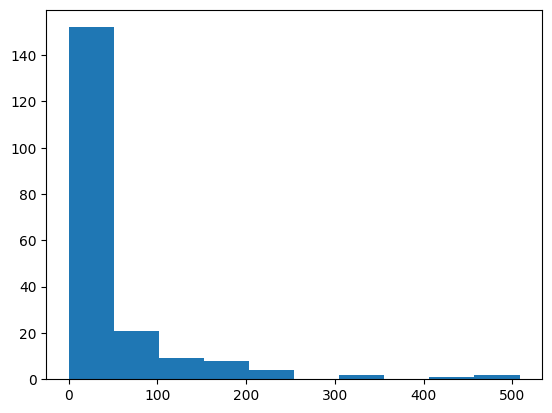

In [7]:
grafik1=plt.hist(df["A.1"])


Text(0.5, 1.0, 'A.2.1')

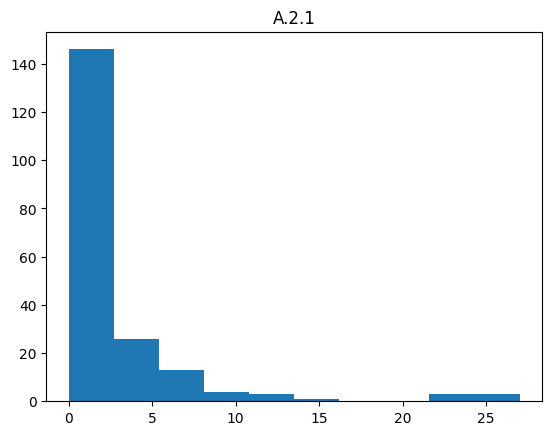

In [70]:
plt.hist(df["A.2.1"])
plt.title("A.2.1")

Text(0.5, 1.0, 'A.2.2')

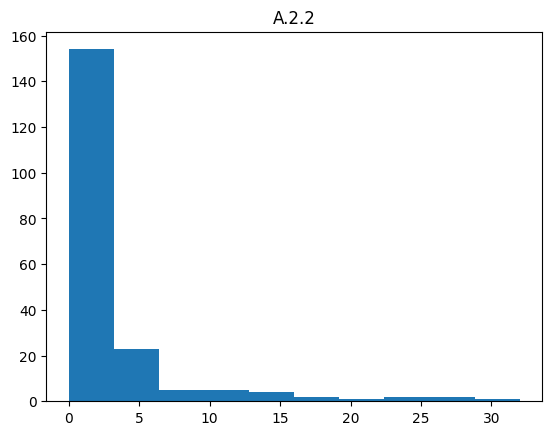

In [71]:
plt.hist(df["A.2.2"])
plt.title("A.2.2")

Text(0.5, 1.0, 'A.10')

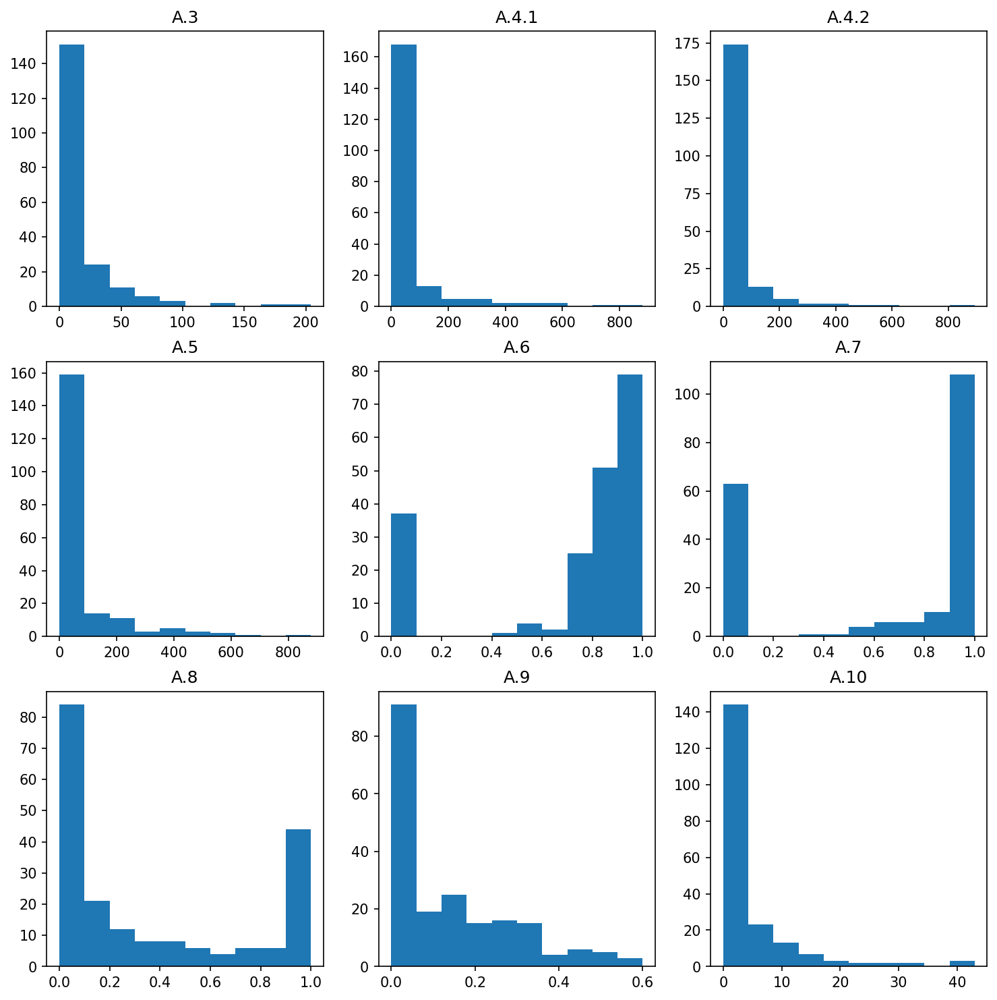

In [72]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df["A.3"])
plt.title("A.3")
plt.subplot(3,3,2)
plt.hist(df["A.4.1"])
plt.title("A.4.1")
plt.subplot(3,3,3)
plt.hist(df["A.4.2"])
plt.title("A.4.2")
plt.subplot(3,3,4)
plt.hist(df["A.5"])
plt.title("A.5")
plt.subplot(3,3,5)
plt.hist(df["A.6"])
plt.title("A.6")
plt.subplot(3,3,6)
plt.hist(df["A.7"])
plt.title("A.7")
plt.subplot(3,3,7)
plt.hist(df["A.8"])
plt.title("A.8")
plt.subplot(3,3,8)
plt.hist(df["A.9"])
plt.title("A.9")
plt.subplot(3,3,9)
plt.hist(df["A.10"])
plt.title("A.10")


Text(0.5, 1.0, 'B.6')

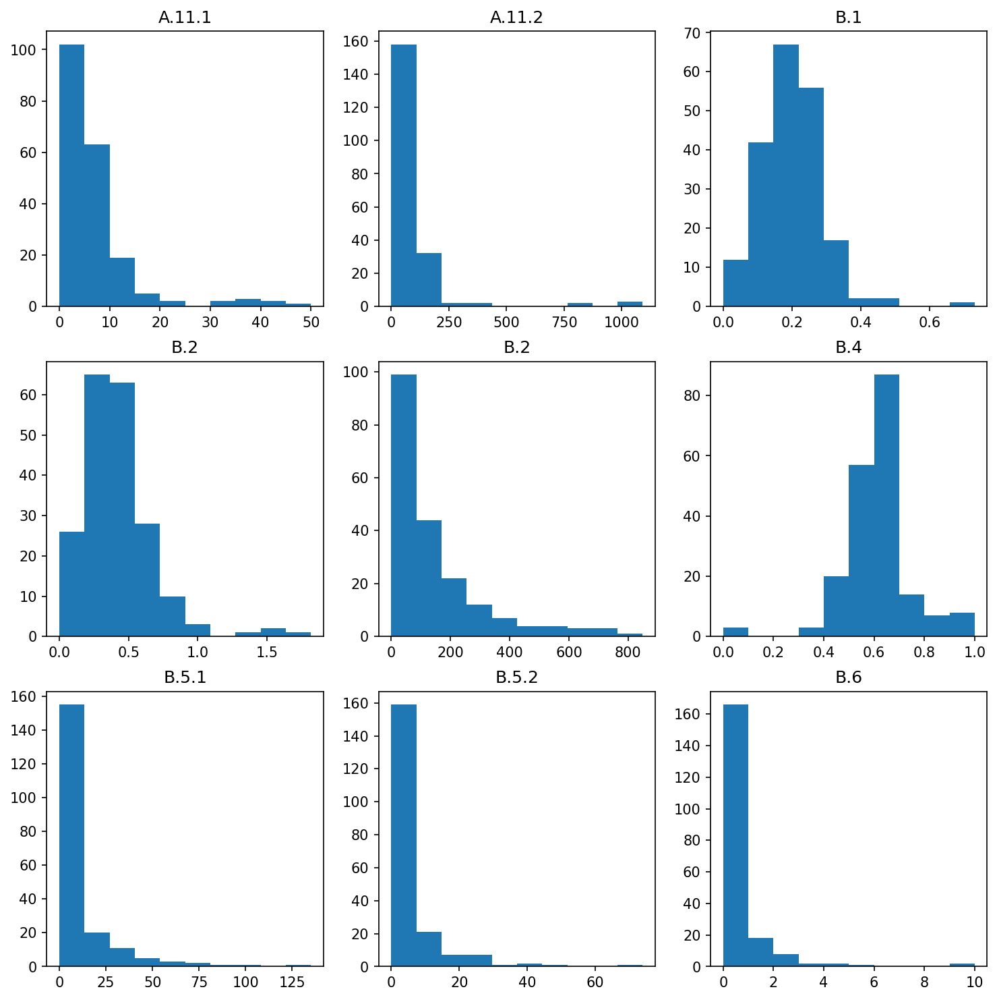

In [73]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df["A.11.1"])
plt.title("A.11.1")
plt.subplot(3,3,2)
plt.hist(df["A.11.2"])
plt.title("A.11.2")
plt.subplot(3,3,3)
plt.hist(df["B.1"])
plt.title("B.1")
plt.subplot(3,3,4)
plt.hist(df["B.2"])
plt.title("B.2")
plt.subplot(3,3,5)
plt.hist(df["B.3"])
plt.title("B.2")
plt.subplot(3,3,6)
plt.hist(df["B.4"])
plt.title("B.4")
plt.subplot(3,3,7)
plt.hist(df["B.5.1"])
plt.title("B.5.1")
plt.subplot(3,3,8)
plt.hist(df["B.5.2"])
plt.title("B.5.2")
plt.subplot(3,3,9)
plt.hist(df["B.6"])
plt.title("B.6")

Text(0.5, 1.0, 'B.14.1')

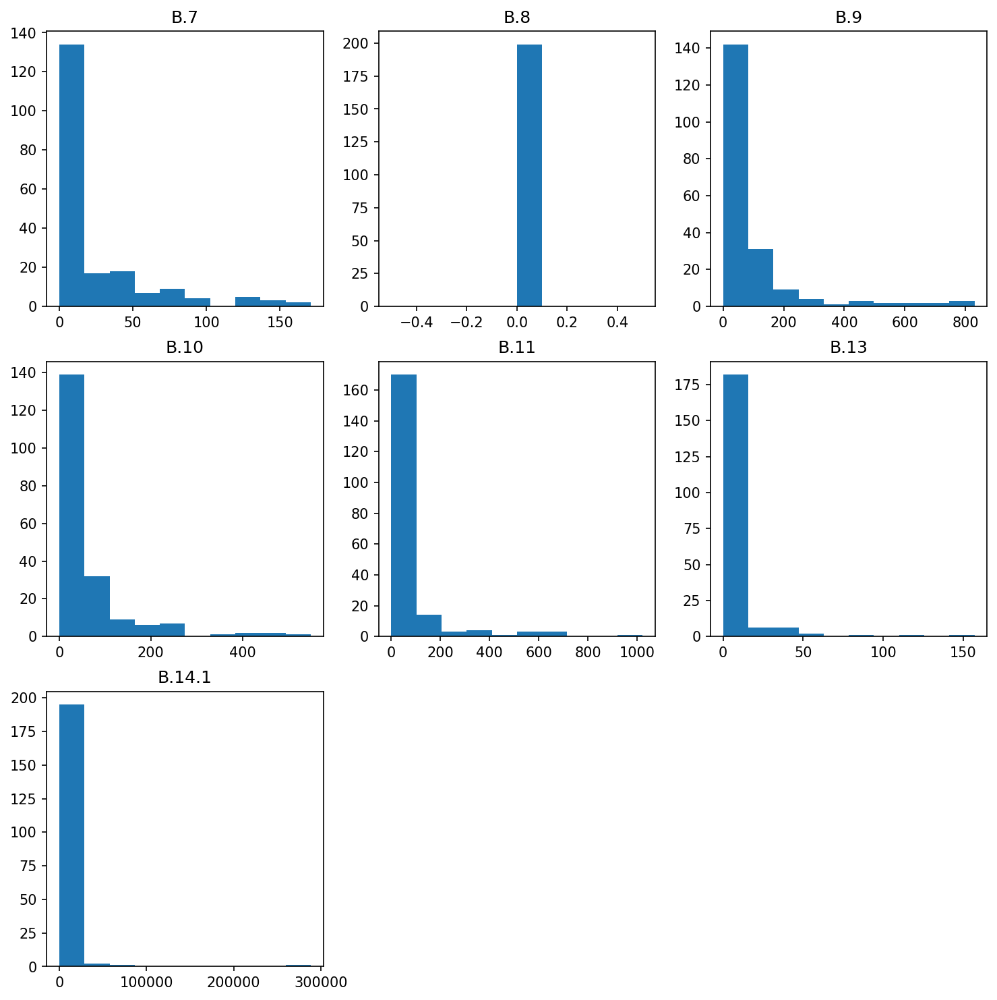

In [74]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df["B.7"])
plt.title("B.7")
plt.subplot(3,3,2)
plt.hist(df["B.8"])
plt.title("B.8")
plt.subplot(3,3,3)
plt.hist(df["B.9"])
plt.title("B.9")
plt.subplot(3,3,4)
plt.hist(df["B.10"])
plt.title("B.10")
plt.subplot(3,3,5)
plt.hist(df["B.11"])
plt.title("B.11")
plt.subplot(3,3,6)
plt.hist(df["B.13"])
plt.title("B.13")
plt.subplot(3,3,7)
plt.hist(df["B.14.1"])
plt.title("B.14.1")


Text(0.5, 1.0, 'C.1.2')

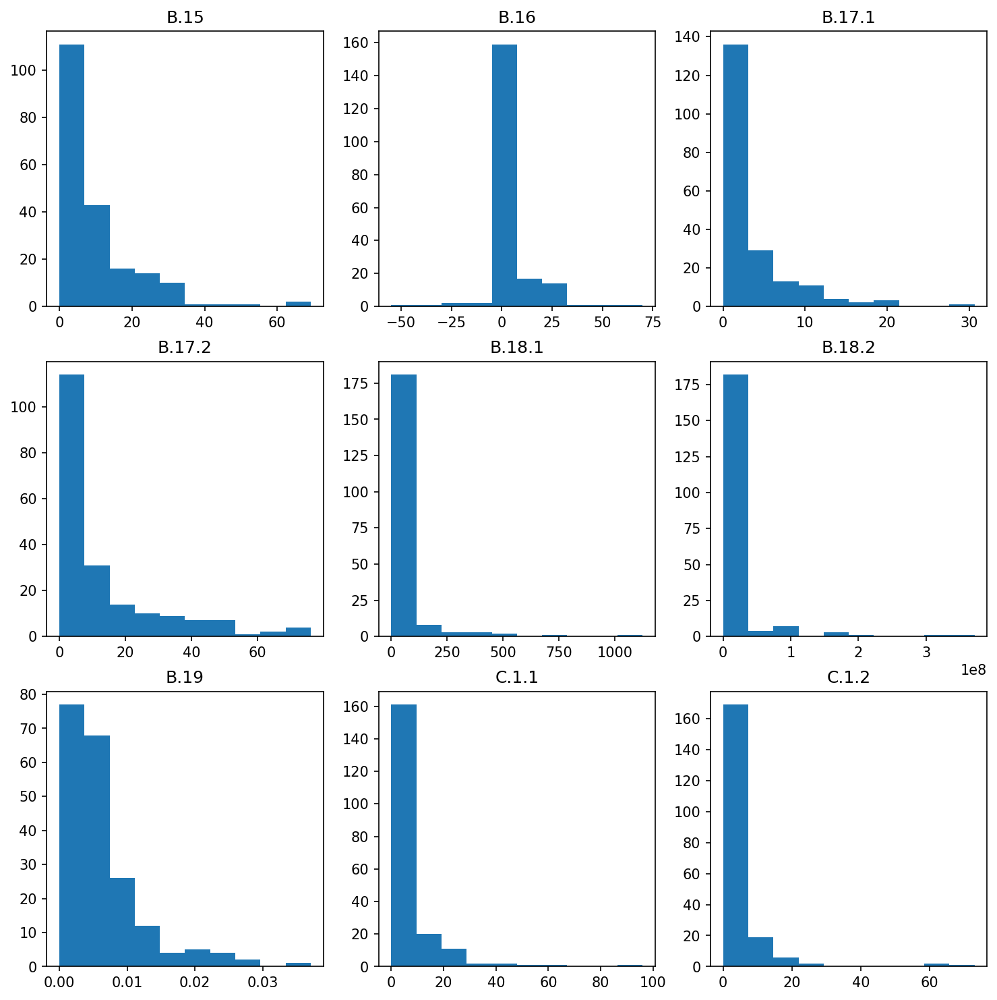

In [81]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df["B.15"])
plt.title("B.15")
plt.subplot(3,3,2)
plt.hist(df["B.16"])
plt.title("B.16")
plt.subplot(3,3,3)
plt.hist(df["B.17.1"])
plt.title("B.17.1")
plt.subplot(3,3,4)
plt.hist(df["B.17.2"])
plt.title("B.17.2")
plt.subplot(3,3,5)
plt.hist(df["B.18.1"])
plt.title("B.18.1")
plt.subplot(3,3,6)
plt.hist(df["B.18.2"])
plt.title("B.18.2")
plt.subplot(3,3,7)
plt.hist(df["B.19"])
plt.title("B.19")
plt.subplot(3,3,8)
plt.hist(df["C.1.1"])
plt.title("C.1.1")
plt.subplot(3,3,9)
plt.hist(df["C.1.2"])
plt.title("C.1.2")

Text(0.5, 1.0, 'D.2')

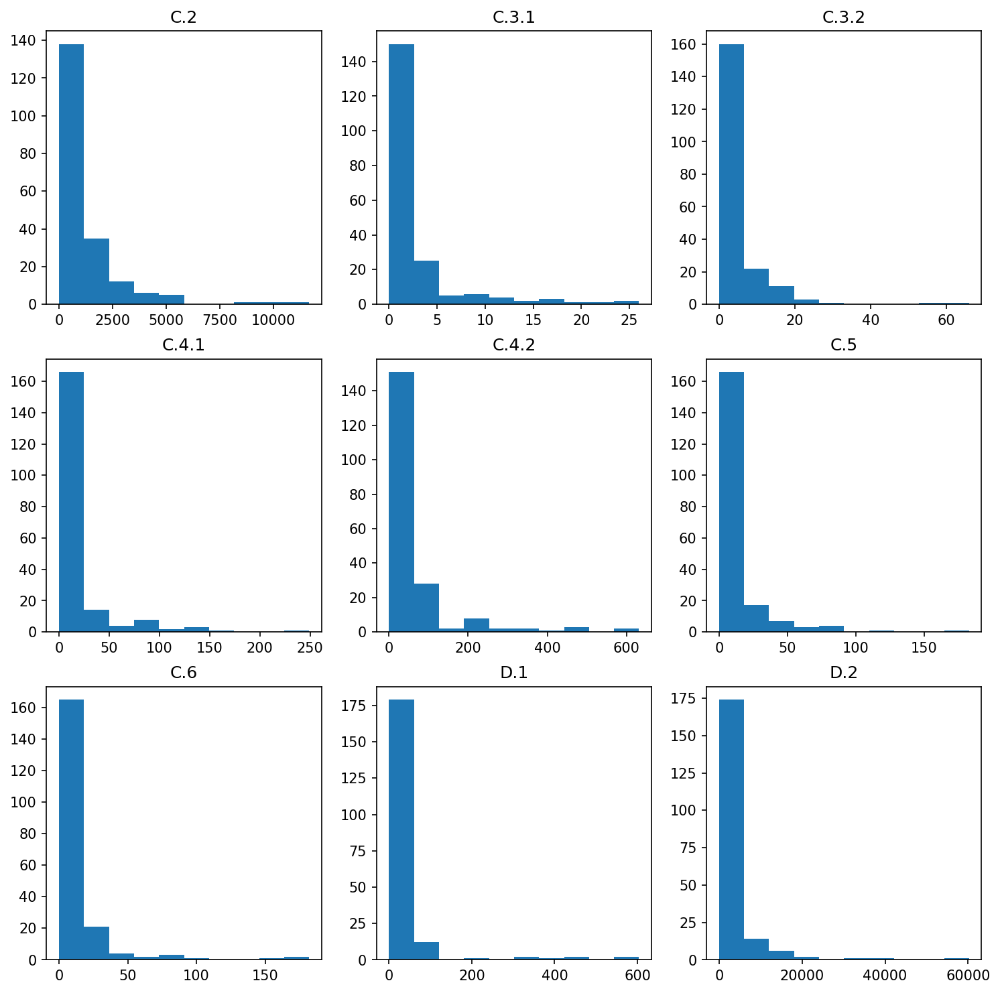

In [82]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df["C.2"])
plt.title("C.2")
plt.subplot(3,3,2)
plt.hist(df["C.3.1"])
plt.title("C.3.1")
plt.subplot(3,3,3)
plt.hist(df["C.3.2"])
plt.title("C.3.2")
plt.subplot(3,3,4)
plt.hist(df["C.4.1"])
plt.title("C.4.1")
plt.subplot(3,3,5)
plt.hist(df["C.4.2"])
plt.title("C.4.2")
plt.subplot(3,3,6)
plt.hist(df["C.5"])
plt.title("C.5")
plt.subplot(3,3,7)
plt.hist(df["C.6"])
plt.title("C.6")
plt.subplot(3,3,8)
plt.hist(df["D.1"])
plt.title("D.1")
plt.subplot(3,3,9)
plt.hist(df["D.2"])
plt.title("D.2")

Text(0.5, 1.0, 'D.9')

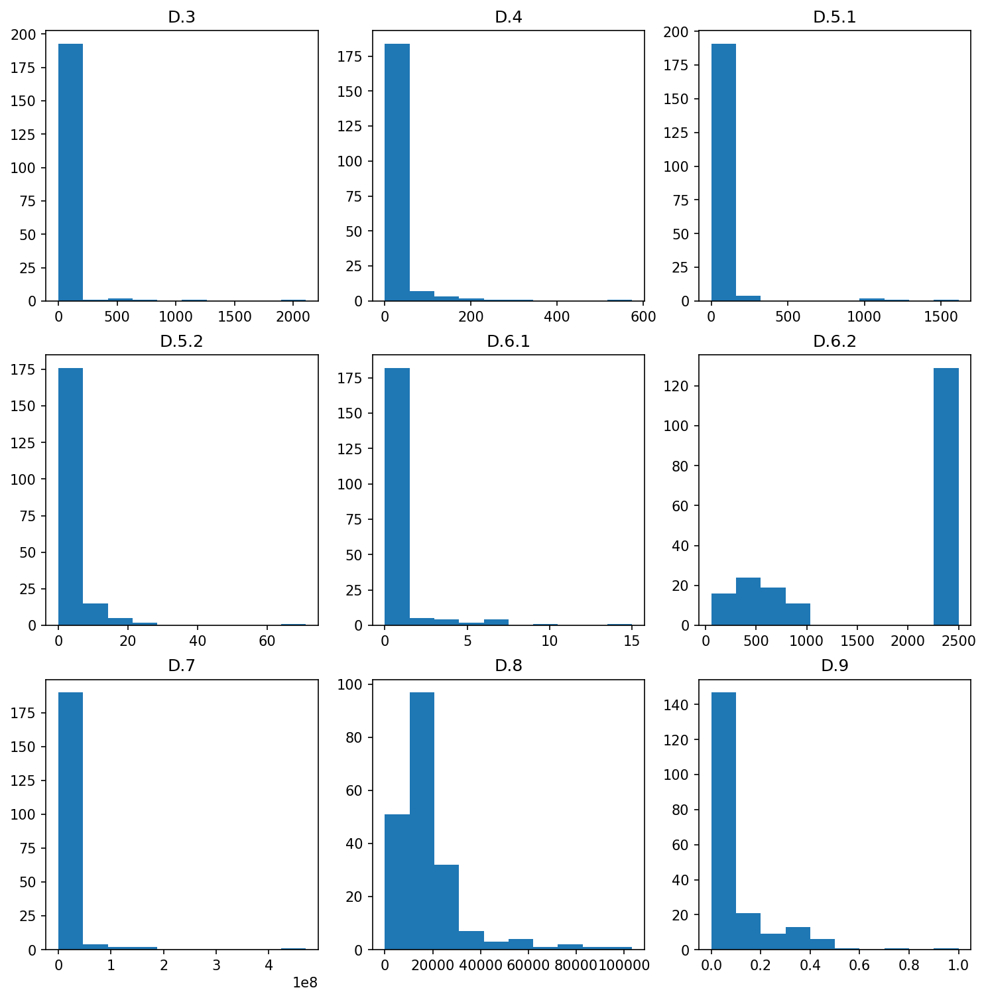

In [83]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df["D.3"])
plt.title("D.3")
plt.subplot(3,3,2)
plt.hist(df["D.4"])
plt.title("D.4")
plt.subplot(3,3,3)
plt.hist(df["D.5.1"])
plt.title("D.5.1")
plt.subplot(3,3,4)
plt.hist(df["D.5.2"])
plt.title("D.5.2")
plt.subplot(3,3,5)
plt.hist(df["D.6.1"])
plt.title("D.6.1")
plt.subplot(3,3,6)
plt.hist(df["D.6.2"])
plt.title("D.6.2")
plt.subplot(3,3,7)
plt.hist(df["D.7"])
plt.title("D.7")
plt.subplot(3,3,8)
plt.hist(df["D.8"])
plt.title("D.8")
plt.subplot(3,3,9)
plt.hist(df["D.9"])
plt.title("D.9")

In [75]:
corelation=df.corr()

C:\Users\arsla\AppData\Local\Temp\ipykernel_28252\3476424618.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corelation=df.corr()


In [76]:
corelation


,A.1,A.2.1,A.2.2,A.3,A.4.1,A.4.2,A.5,A.6,A.7,A.8,...,D.2,D.3,D.4,D.5.1,D.5.2,D.6.1,D.6.2,D.7,D.8,D.9
A.1,1.000000,0.860570,0.766960,0.532056,0.337533,0.621871,0.360316,0.145475,0.083779,0.160558,...,0.123250,0.203914,0.626179,0.319690,0.245382,0.260066,-0.354236,0.306466,0.054678,-0.077415
A.2.1,0.860570,1.000000,0.844603,0.561870,0.357975,0.531239,0.240959,0.134708,0.060311,0.140126,...,0.043989,0.136232,0.424239,0.392812,0.253986,0.316798,-0.318484,0.346702,0.045478,-0.091835
A.2.2,0.766960,0.844603,1.000000,0.529982,0.314107,0.530236,0.284991,0.113099,0.028479,0.201684,...,0.102055,0.172496,0.387460,0.285703,0.161261,0.293586,-0.277852,0.388334,0.195195,0.031884
A.3,0.532056,0.561870,0.529982,1.000000,0.542935,0.442656,0.369537,0.045431,0.040740,0.177333,...,0.179781,0.542944,0.389912,0.473277,0.161379,0.441559,-0.300468,0.342199,0.208779,0.084725
A.4.1,0.337533,0.357975,0.314107,0.542935,1.000000,0.381976,0.319893,-0.050162,-0.149468,0.027233,...,0.064363,0.424877,0.416023,0.286284,0.052263,0.403718,-0.360450,0.135823,0.025855,-0.009252
A.4.2,0.621871,0.531239,0.530236,0.442656,0.381976,1.000000,0.361197,0.109964,-0.000170,0.190616,...,0.121535,0.232929,0.374463,0.198873,0.012386,0.382038,-0.364717,0.157312,0.064035,0.027187
A.5,0.360316,0.240959,0.284991,0.369537,0.319893,0.361197,1.000000,0.000843,-0.026650,0.193197,...,0.144728,0.063688,0.173639,0.060120,-0.011360,0.169083,-0.249783,0.323505,0.108701,0.078224
A.6,0.145475,0.134708,0.113099,0.045431,-0.050162,0.109964,0.000843,1.000000,0.548969,0.358170,...,0.077011,0.067924,0.090574,0.103505,-0.057977,0.016626,-0.025591,0.029513,-0.050433,-0.000447
A.7,0.083779,0.060311,0.028479,0.040740,-0.149468,-0.000170,-0.026650,0.548969,1.000000,0.442052,...,0.038231,-0.039252,0.029215,0.097361,-0.017275,-0.024060,0.012844,0.022979,-0.099359,-0.050649
A.8,0.160558,0.140126,0.201684,0.177333,0.027233,0.190616,0.193197,0.358170,0.442052,1.000000,...,0.131147,0.083961,0.047654,0.110971,0.101121,0.117870,-0.158646,0.111819,-0.082215,-0.024713


In [91]:
plt.figure(figsize=(35,34),dpi=600)
sns.heatmap(corelation,annot=True)


<Axes: >

<Axes: >

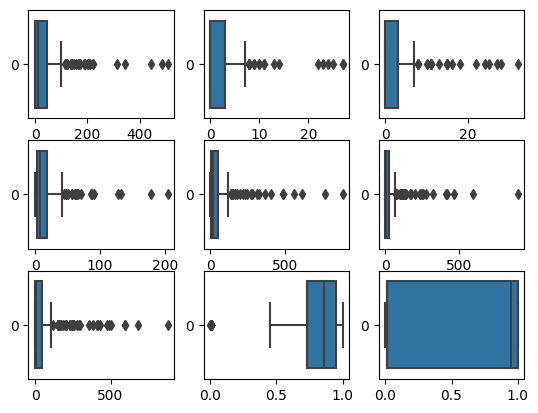

In [104]:
plt.subplot(3,3,1)
sns.boxplot(df["A.1"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df["A.2.1"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df["A.2.2"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df["A.3"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df["A.4.1"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df["A.4.2"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df["A.5"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df["A.6"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df["A.7"],orient="horizontal")

<Axes: >

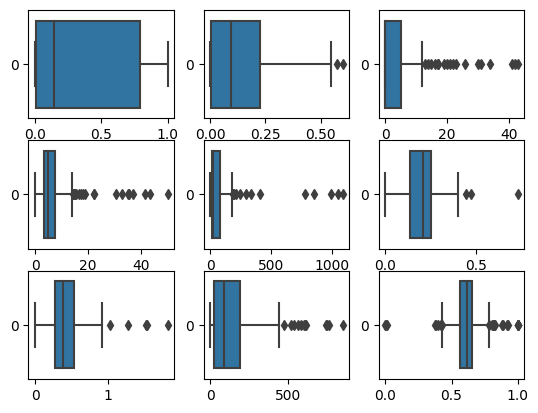

In [105]:
plt.subplot(3,3,1)
sns.boxplot(df["A.8"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df["A.9"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df["A.10"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df["A.11.1"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df["A.11.2"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df["B.1"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df["B.2"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df["B.3"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df["B.4"],orient="horizontal")

<Axes: >

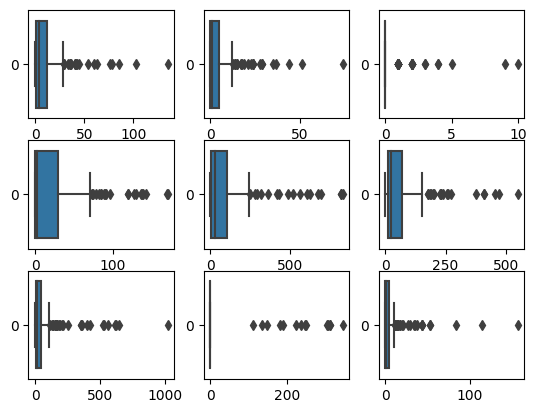

In [107]:
plt.subplot(3,3,1)
sns.boxplot(df["B.5.1"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df["B.5.2"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df["B.6"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df["B.7"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df["B.9"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df["B.10"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df["B.11"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df["B.12.5"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df["B.13"],orient="horizontal")

<Axes: >

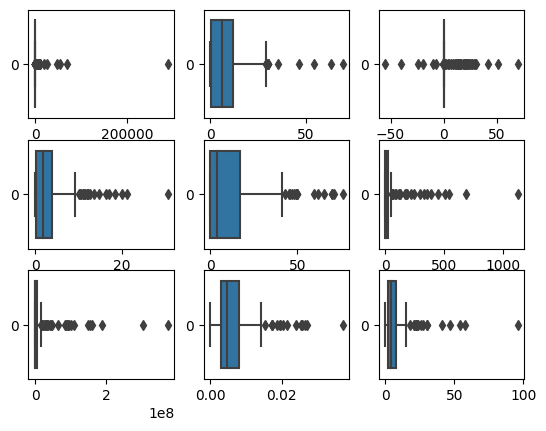

In [108]:
plt.subplot(3,3,1)
sns.boxplot(df["B.14.1"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df["B.15"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df["B.16"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df["B.17.1"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df["B.17.2"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df["B.18.1"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df["B.18.2"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df["B.19"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df["C.1.1"],orient="horizontal")

<Axes: >

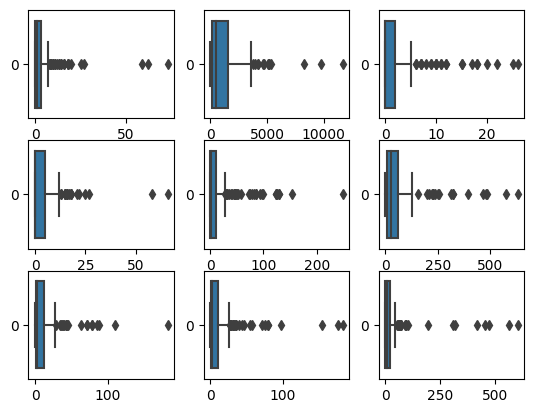

In [109]:
plt.subplot(3,3,1)
sns.boxplot(df["C.1.2"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df["C.2"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df["C.3.1"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df["C.3.2"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df["C.4.1"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df["C.4.2"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df["C.5"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df["C.6"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df["D.1"],orient="horizontal")

<Axes: >

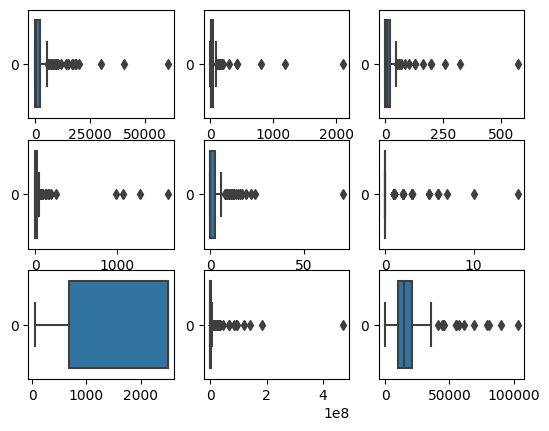

In [110]:
plt.subplot(3,3,1)
sns.boxplot(df["D.2"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df["D.3"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df["D.4"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df["D.5.1"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df["D.5.2"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df["D.6.1"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df["D.6.2"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df["D.7"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df["D.8"],orient="horizontal")

# Dağılım Düzeltme İşlemi


In [5]:
df_copya=df.copy()

In [6]:
df_copya["A.1"]=np.log(df["A.1"]-df["A.1"].min()+1)
df_copya["A.2.1"]=np.log(df["A.2.1"]-df["A.2.1"].min()+1)
df_copya["A.2.2"]=np.log(df["A.2.2"]-df["A.2.2"].min()+1)
df_copya["A.3"]=np.log(df["A.3"]-df["A.3"].min()+1)
df_copya["A.4.1"]=np.log(df["A.4.1"]-df["A.4.1"].min()+1)
df_copya["A.4.2"]=np.log(df["A.4.2"]-df["A.4.2"].min()+1)
df_copya["A.5"]=np.log(df["A.5"]-df["A.5"].min()+1)
df_copya["A.6"]=np.log(df["A.6"]-df["A.6"].min()+1)
df_copya["A.7"]=np.log(df["A.7"]-df["A.7"].min()+1)
df_copya["A.8"]=np.log(df["A.8"]-df["A.8"].min()+1)
df_copya["A.9"]=np.log(df["A.9"]-df["A.9"].min()+1)
df_copya["A.10"]=np.log(df["A.10"]-df["A.10"].min()+1)
df_copya["A.11.1"]=np.log(df["A.11.1"]-df["A.11.1"].min()+1)
df_copya["A.11.2"]=np.log(df["A.11.2"]-df["A.11.2"].min()+1)
df_copya["B.2"]=np.log(df["B.2"]-df["B.2"].min()+1)
df_copya["B.3"]=np.log(df["B.3"]-df["B.3"].min()+1)
df_copya["B.4"]=np.log(df["B.4"]-df["B.4"].min()+1)
df_copya["B.5.1"]=np.log(df["B.5.1"]-df["B.5.1"].min()+1)
df_copya["B.5.2"]=np.log(df["B.5.2"]-df["B.5.2"].min()+1)
df_copya["B.6"]=np.log(df["B.6"]-df["B.6"].min()+1)
df_copya["B.7"]=np.log(df["B.7"]-df["B.7"].min()+1)
df_copya["B.9"]=np.log(df["B.9"]-df["B.9"].min()+1)
df_copya["B.10"]=np.log(df["B.10"]-df["B.10"].min()+1)
df_copya["B.11"]=np.log(df["B.11"]-df["B.11"].min()+1)
df_copya["B.13"]=np.log(df["B.13"]-df["B.13"].min()+1)
df_copya["B.14.1"]=np.log(df["B.14.1"]-df["B.14.1"].min()+1)
df_copya["B.15"]=np.log(df["B.15"]-df["B.15"].min()+1)
df_copya["B.16"]=np.log(df["B.16"]-df["B.16"].min()+1)
df_copya["B.17.1"]=np.log(df["B.17.1"]-df["B.17.1"].min()+1)
df_copya["B.17.2"]=np.log(df["B.17.2"]-df["B.17.2"].min()+1)
df_copya["B.18.1"]=np.log(df["B.18.1"]-df["B.18.1"].min()+1)
df_copya["B.18.2"]=np.log(df["B.18.2"]-df["B.18.2"].min()+1)
df_copya["B.19"]=np.log(df["B.19"]-df["B.19"].min()+1)
df_copya["C.1.1"]=np.log(df["C.1.1"]-df["C.1.1"].min()+1)
df_copya["C.1.2"]=np.log(df["C.1.2"]-df["C.1.2"].min()+1)
df_copya["C.2"]=np.log(df["C.2"]-df["C.2"].min()+1)
df_copya["C.3.1"]=np.log(df["C.3.1"]-df["C.3.1"].min()+1)
df_copya["C.3.2"]=np.log(df["C.3.2"]-df["C.3.2"].min()+1)
df_copya["C.4.1"]=np.log(df["C.4.1"]-df["C.4.1"].min()+1)
df_copya["C.4.2"]=np.log(df["C.4.2"]-df["C.4.2"].min()+1)
df_copya["C.5"]=np.log(df["C.5"]-df["C.5"].min()+1)
df_copya["C.6"]=np.log(df["C.6"]-df["C.6"].min()+1)
df_copya["D.1"]=np.log(df["D.1"]-df["D.1"].min()+1)
df_copya["D.2"]=np.log(df["D.2"]-df["D.2"].min()+1)
df_copya["D.3"]=np.log(df["D.3"]-df["D.3"].min()+1)
df_copya["D.4"]=np.log(df["D.4"]-df["D.4"].min()+1)
df_copya["D.5.1"]=np.log(df["D.5.1"]-df["D.5.1"].min()+1)
df_copya["D.5.2"]=np.log(df["D.5.2"]-df["D.5.2"].min()+1)
df_copya["D.6.1"]=np.log(df["D.6.1"]-df["D.6.1"].min()+1)
df_copya["D.6.2"]=np.log(df["D.6.2"]-df["D.6.2"].min()+1)
df_copya["D.7"]=np.log(df["D.7"]-df["D.7"].min()+1)
df_copya["D.8"]=np.log(df["D.8"]-df["D.8"].min()+1)
df_copya["D.9"]=np.log(df["D.9"]-df["D.9"].min()+1)

In [14]:
df_copya

,Üniversite/Gosterge,A.1,A.2.1,A.2.2,A.3,A.4.1,A.4.2,A.5,A.6,A.7,...,D.2,D.3,D.4,D.5.1,D.5.2,D.6.1,D.6.2,D.7,D.8,D.9
0,abdullah-gul-universitesi.pdf,1.609438,0.000000,1.386294,3.688879,2.995732,4.682131,6.216606,0.693147,0.684611,...,5.814131,3.433987,2.995732,3.295837,0.000000,0.000000,7.801391,13.599490,10.192044,0.146694
1,acibadem-mehmet-ali-aydinlar-universitesi.pdf,2.197225,0.000000,0.000000,2.995732,3.433987,2.995732,0.000000,0.662688,0.693147,...,7.650169,3.688879,3.784190,3.258097,0.000000,0.000000,7.801391,18.594049,10.490607,0.300105
2,adana-alparslan-turkes-bilim-ve-teknoloji-univ...,0.000000,0.000000,0.000000,2.302585,0.693147,0.000000,3.583519,0.604316,0.693147,...,4.653960,3.178054,1.945910,2.564949,0.000000,0.000000,7.801391,0.000000,9.930811,0.135405
3,adiyaman-universitesi.pdf,2.079442,1.386294,1.609438,0.000000,1.386294,0.693147,0.693147,0.631272,0.693147,...,6.895683,5.198497,1.098612,1.098612,2.302585,1.945910,6.236370,9.818801,9.431161,0.009950
4,afyon-kocatepe-universitesi.pdf,3.401197,1.098612,1.609438,1.609438,1.098612,1.098612,0.000000,0.583332,0.403463,...,6.338594,3.218876,1.791759,1.386294,2.772589,0.000000,5.662960,9.390159,9.119211,0.008960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,yeditepe-universitesi.pdf,4.477337,0.693147,1.098612,3.178054,3.583519,3.871201,3.806662,0.654926,0.009950,...,9.748411,4.828314,3.367296,3.258097,0.000000,0.000000,4.077537,10.900455,10.146591,0.292670
195,yildiz-teknik-universitesi.pdf,5.323010,2.708050,2.772589,4.477337,6.180017,6.137727,1.248468,0.009950,0.009950,...,8.478452,4.653960,3.178054,3.871201,1.386294,2.079442,3.931826,16.535531,9.751210,0.285179
196,yozgat-bozok-universitesi.pdf,1.945910,0.693147,0.693147,1.386294,4.430817,2.079442,0.000000,0.007968,0.006976,...,7.030857,4.060443,3.091042,2.197225,2.302585,0.693147,7.801391,15.725684,9.457357,0.000000
197,yuksek-ihtisas-universitesi.pdf,0.000000,0.000000,0.000000,0.693147,3.891820,0.000000,0.000000,0.007968,0.009950,...,6.324359,3.806662,0.000000,3.465736,0.000000,1.386294,7.801391,0.000000,10.133130,0.135405


# Düzeltilmiş Histogram Grafiği

(array([104.,  25.,   0.,  25.,   9.,  16.,   4.,   8.,   3.,   5.]),
 array([0.        , 0.34965076, 0.69930151, 1.04895227, 1.39860302,
        1.74825378, 2.09790454, 2.44755529, 2.79720605, 3.14685681,
        3.49650756]),
 <BarContainer object of 10 artists>)

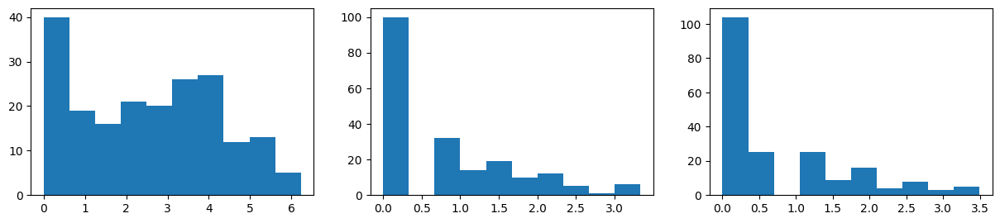

In [38]:
plt.figure(figsize=(15,10))
plt.subplot(3,3,1)
plt.hist(df_copya["A.1"])
plt.subplot(3,3,2)
plt.hist(df_copya["A.2.1"])
plt.subplot(3,3,3)
plt.hist(df_copya["A.2.2"])

Text(0.5, 1.0, 'A.10')

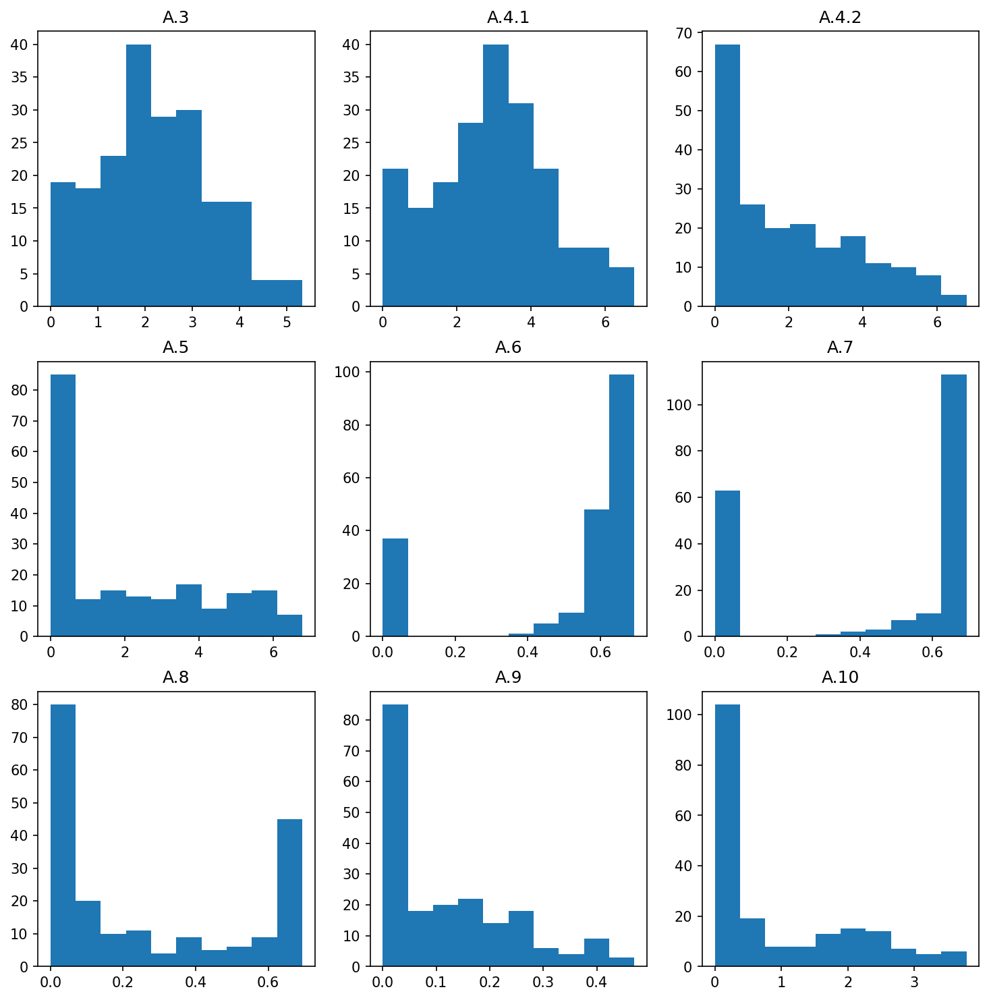

In [42]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df_copya["A.3"])
plt.title("A.3")
plt.subplot(3,3,2)
plt.hist(df_copya["A.4.1"])
plt.title("A.4.1")
plt.subplot(3,3,3)
plt.hist(df_copya["A.4.2"])
plt.title("A.4.2")
plt.subplot(3,3,4)
plt.hist(df_copya["A.5"])
plt.title("A.5")
plt.subplot(3,3,5)
plt.hist(df_copya["A.6"])
plt.title("A.6")
plt.subplot(3,3,6)
plt.hist(df_copya["A.7"])
plt.title("A.7")
plt.subplot(3,3,7)
plt.hist(df_copya["A.8"])
plt.title("A.8")
plt.subplot(3,3,8)
plt.hist(df_copya["A.9"])
plt.title("A.9")
plt.subplot(3,3,9)
plt.hist(df_copya["A.10"])
plt.title("A.10")

Text(0.5, 1.0, 'B.6')

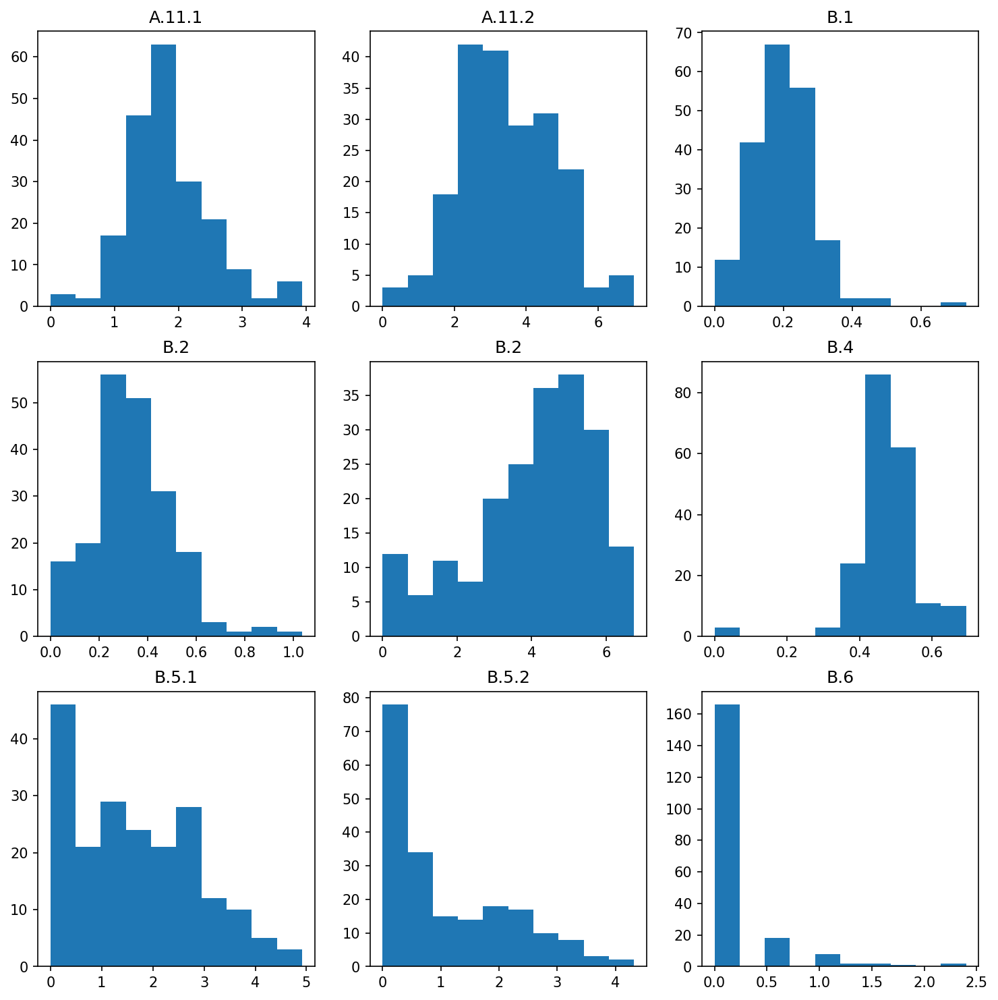

In [43]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df_copya["A.11.1"])
plt.title("A.11.1")
plt.subplot(3,3,2)
plt.hist(df_copya["A.11.2"])
plt.title("A.11.2")
plt.subplot(3,3,3)
plt.hist(df_copya["B.1"])
plt.title("B.1")
plt.subplot(3,3,4)
plt.hist(df_copya["B.2"])
plt.title("B.2")
plt.subplot(3,3,5)
plt.hist(df_copya["B.3"])
plt.title("B.2")
plt.subplot(3,3,6)
plt.hist(df_copya["B.4"])
plt.title("B.4")
plt.subplot(3,3,7)
plt.hist(df_copya["B.5.1"])
plt.title("B.5.1")
plt.subplot(3,3,8)
plt.hist(df_copya["B.5.2"])
plt.title("B.5.2")
plt.subplot(3,3,9)
plt.hist(df_copya["B.6"])
plt.title("B.6")

Text(0.5, 1.0, 'B.14.1')

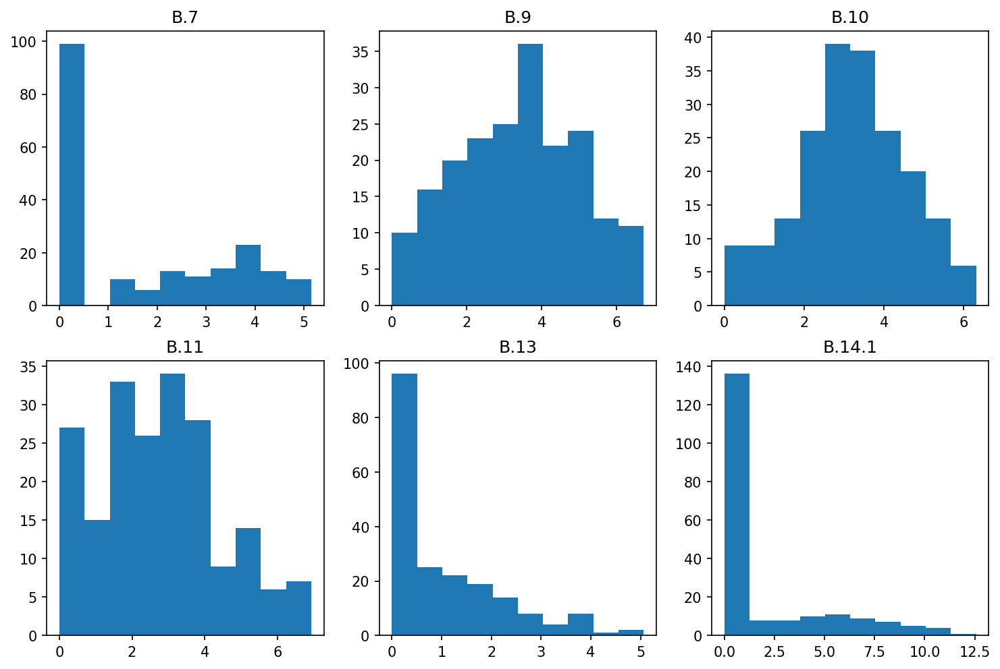

In [46]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df_copya["B.7"])
plt.title("B.7")
plt.subplot(3,3,2)
plt.hist(df_copya["B.9"])
plt.title("B.9")
plt.subplot(3,3,3)
plt.hist(df_copya["B.10"])
plt.title("B.10")
plt.subplot(3,3,4)
plt.hist(df_copya["B.11"])
plt.title("B.11")
plt.subplot(3,3,5)
plt.hist(df_copya["B.13"])
plt.title("B.13")
plt.subplot(3,3,6)
plt.hist(df_copya["B.14.1"])
plt.title("B.14.1")

Text(0.5, 1.0, 'C.1.2')

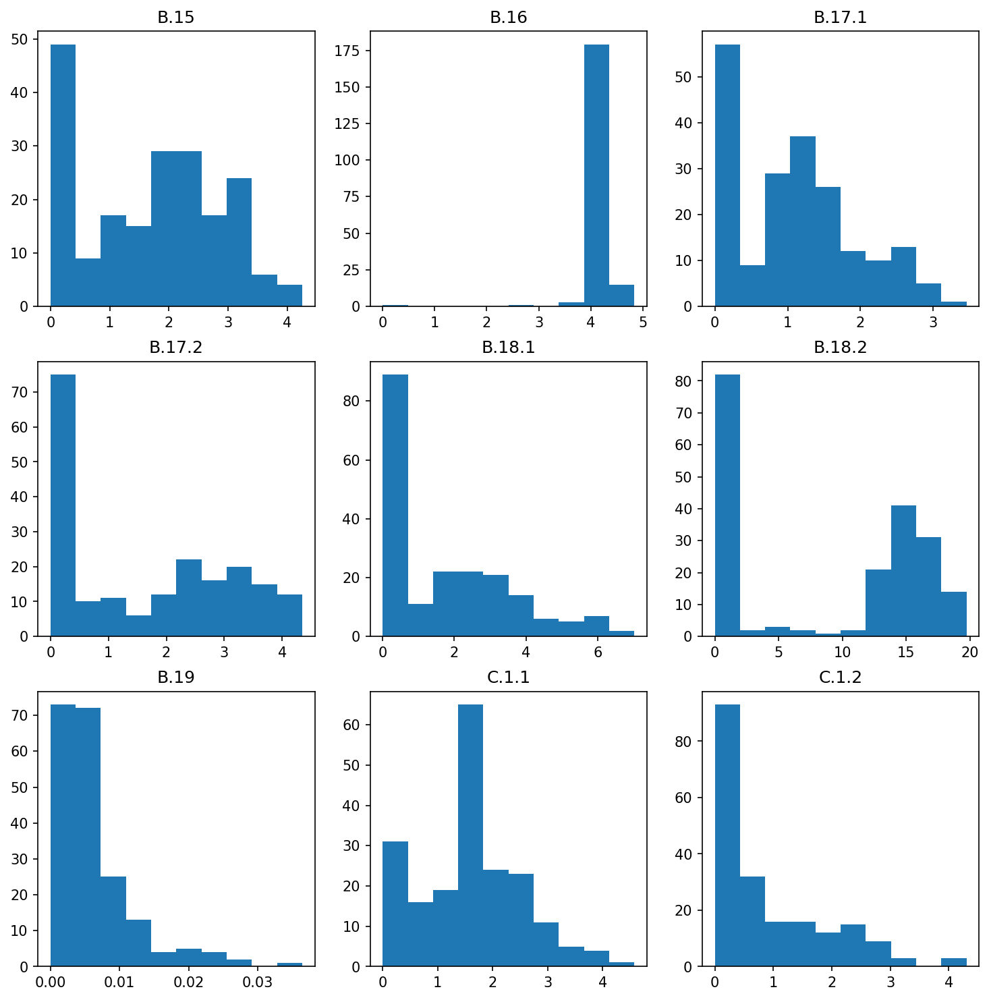

In [47]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df_copya["B.15"])
plt.title("B.15")
plt.subplot(3,3,2)
plt.hist(df_copya["B.16"])
plt.title("B.16")
plt.subplot(3,3,3)
plt.hist(df_copya["B.17.1"])
plt.title("B.17.1")
plt.subplot(3,3,4)
plt.hist(df_copya["B.17.2"])
plt.title("B.17.2")
plt.subplot(3,3,5)
plt.hist(df_copya["B.18.1"])
plt.title("B.18.1")
plt.subplot(3,3,6)
plt.hist(df_copya["B.18.2"])
plt.title("B.18.2")
plt.subplot(3,3,7)
plt.hist(df_copya["B.19"])
plt.title("B.19")
plt.subplot(3,3,8)
plt.hist(df_copya["C.1.1"])
plt.title("C.1.1")
plt.subplot(3,3,9)
plt.hist(df_copya["C.1.2"])
plt.title("C.1.2")

Text(0.5, 1.0, 'D.2')

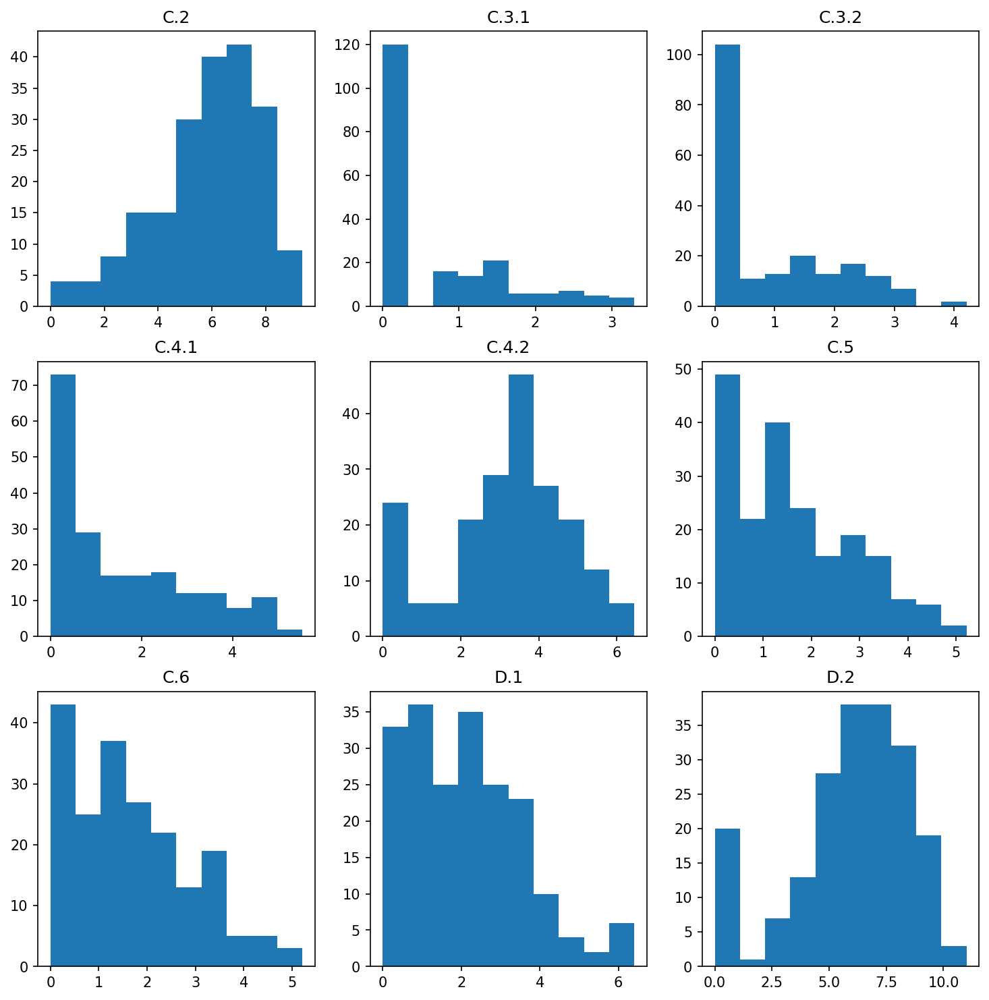

In [48]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df_copya["C.2"])
plt.title("C.2")
plt.subplot(3,3,2)
plt.hist(df_copya["C.3.1"])
plt.title("C.3.1")
plt.subplot(3,3,3)
plt.hist(df_copya["C.3.2"])
plt.title("C.3.2")
plt.subplot(3,3,4)
plt.hist(df_copya["C.4.1"])
plt.title("C.4.1")
plt.subplot(3,3,5)
plt.hist(df_copya["C.4.2"])
plt.title("C.4.2")
plt.subplot(3,3,6)
plt.hist(df_copya["C.5"])
plt.title("C.5")
plt.subplot(3,3,7)
plt.hist(df_copya["C.6"])
plt.title("C.6")
plt.subplot(3,3,8)
plt.hist(df_copya["D.1"])
plt.title("D.1")
plt.subplot(3,3,9)
plt.hist(df_copya["D.2"])
plt.title("D.2")

Text(0.5, 1.0, 'D.9')

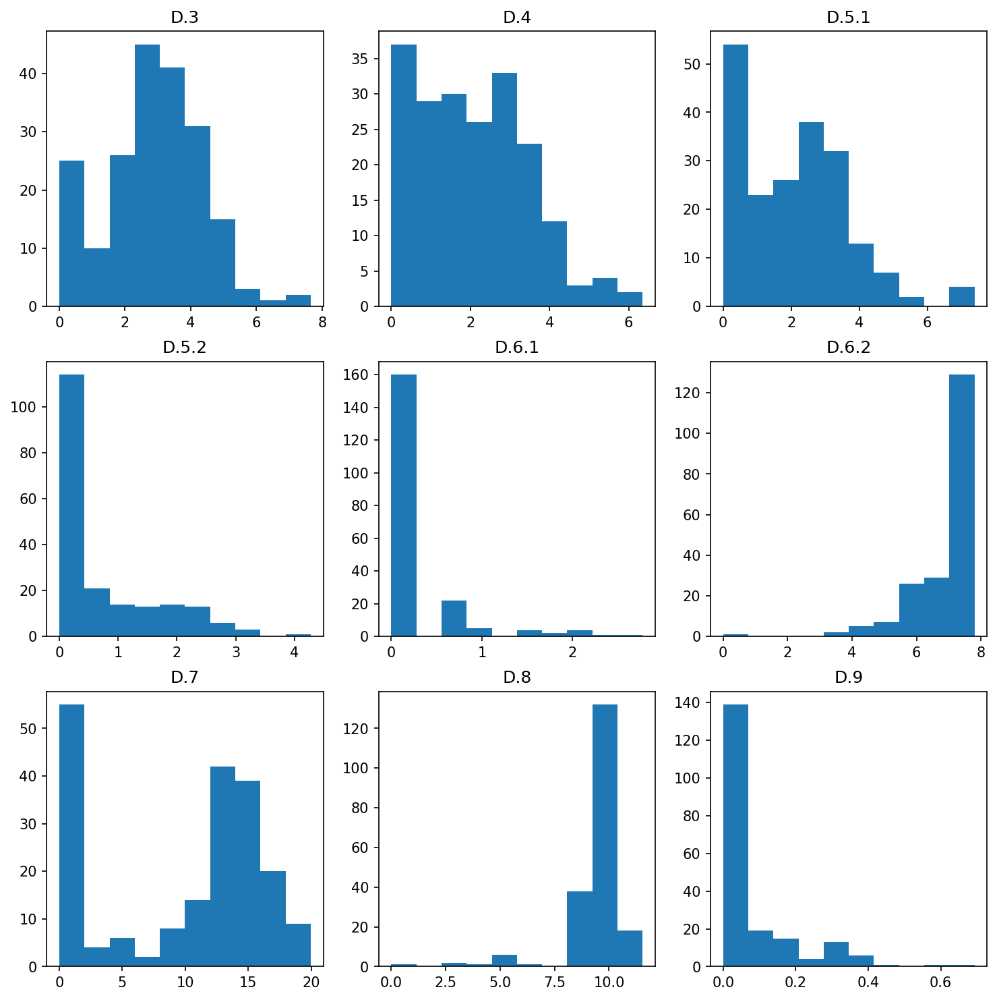

In [49]:
plt.figure(dpi=150,figsize=(12,12))
plt.subplot(3,3,1)
plt.hist(df_copya["D.3"])
plt.title("D.3")
plt.subplot(3,3,2)
plt.hist(df_copya["D.4"])
plt.title("D.4")
plt.subplot(3,3,3)
plt.hist(df_copya["D.5.1"])
plt.title("D.5.1")
plt.subplot(3,3,4)
plt.hist(df_copya["D.5.2"])
plt.title("D.5.2")
plt.subplot(3,3,5)
plt.hist(df_copya["D.6.1"])
plt.title("D.6.1")
plt.subplot(3,3,6)
plt.hist(df_copya["D.6.2"])
plt.title("D.6.2")
plt.subplot(3,3,7)
plt.hist(df_copya["D.7"])
plt.title("D.7")
plt.subplot(3,3,8)
plt.hist(df_copya["D.8"])
plt.title("D.8")
plt.subplot(3,3,9)
plt.hist(df_copya["D.9"])
plt.title("D.9")

# BoxPlot grafikleri

Text(0.5, 1.0, 'A.7')

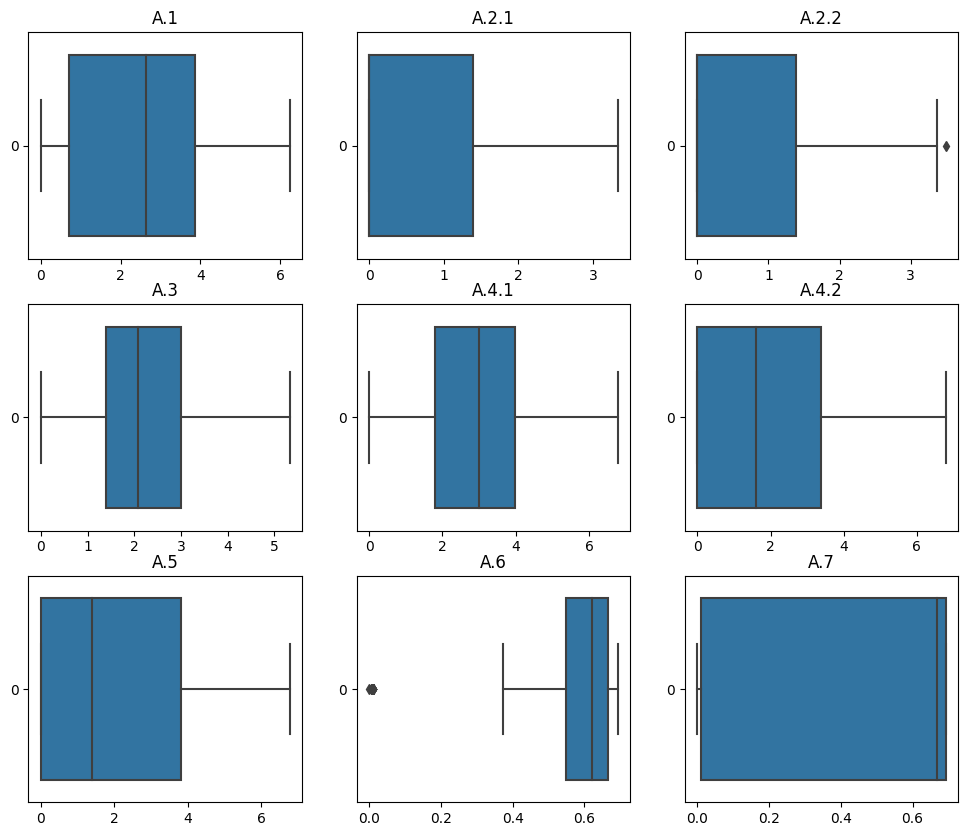

In [61]:
plt.figure(figsize=(12,10))
plt.subplot(3,3,1)
sns.boxplot(df_copya["A.1"],orient="horizontal")
plt.title("A.1")
plt.subplot(3,3,2)
sns.boxplot(df_copya["A.2.1"],orient="horizontal")
plt.title("A.2.1")
plt.subplot(3,3,3)
sns.boxplot(df_copya["A.2.2"],orient="horizontal")
plt.title("A.2.2")
plt.subplot(3,3,4)
sns.boxplot(df_copya["A.3"],orient="horizontal")
plt.title("A.3")
plt.subplot(3,3,5)
sns.boxplot(df_copya["A.4.1"],orient="horizontal")
plt.title("A.4.1")
plt.subplot(3,3,6)
sns.boxplot(df_copya["A.4.2"],orient="horizontal")
plt.title("A.4.2")
plt.subplot(3,3,7)
sns.boxplot(df_copya["A.5"],orient="horizontal")
plt.title("A.5")
plt.subplot(3,3,8)
sns.boxplot(df_copya["A.6"],orient="horizontal")
plt.title("A.6")
plt.subplot(3,3,9)
sns.boxplot(df_copya["A.7"],orient="horizontal")
plt.title("A.7")

Text(0.5, 1.0, 'B.4')

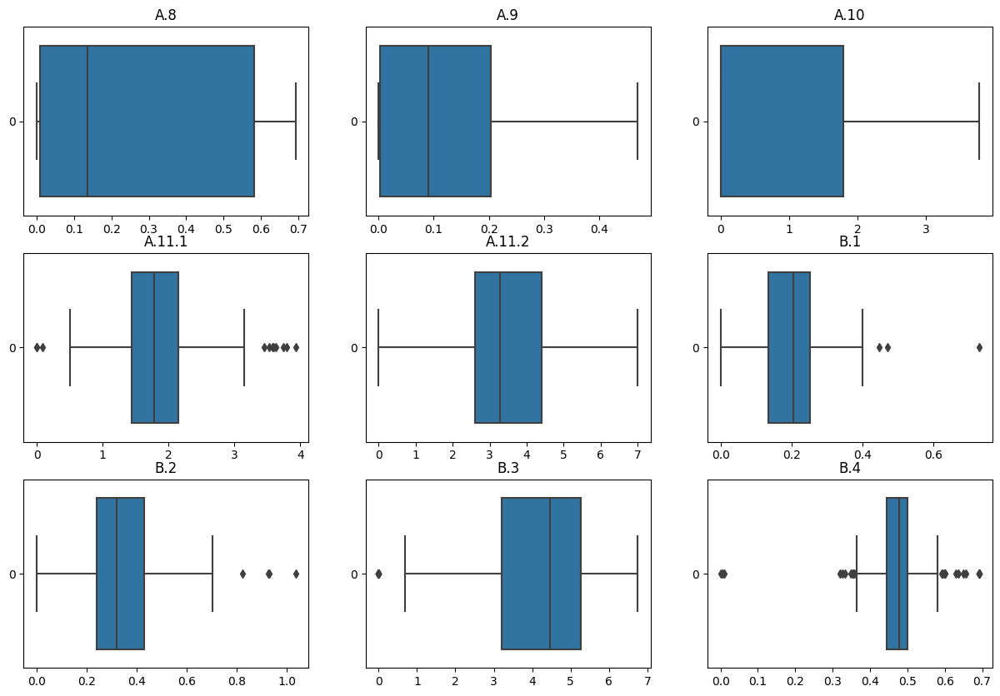

In [63]:
plt.figure(figsize=(15,10))
plt.subplot(3,3,1)
sns.boxplot(df_copya["A.8"],orient="horizontal")
plt.title("A.8")
plt.subplot(3,3,2)
sns.boxplot(df_copya["A.9"],orient="horizontal")
plt.title("A.9")
plt.subplot(3,3,3)
sns.boxplot(df_copya["A.10"],orient="horizontal")
plt.title("A.10")
plt.subplot(3,3,4)
sns.boxplot(df_copya["A.11.1"],orient="horizontal")
plt.title("A.11.1")
plt.subplot(3,3,5)
sns.boxplot(df_copya["A.11.2"],orient="horizontal")
plt.title("A.11.2")
plt.subplot(3,3,6)
sns.boxplot(df_copya["B.1"],orient="horizontal")
plt.title("B.1")
plt.subplot(3,3,7)
sns.boxplot(df_copya["B.2"],orient="horizontal")
plt.title("B.2")
plt.subplot(3,3,8)
sns.boxplot(df_copya["B.3"],orient="horizontal")
plt.title("B.3")
plt.subplot(3,3,9)
sns.boxplot(df_copya["B.4"],orient="horizontal")
plt.title("B.4")

Text(0.5, 1.0, 'B.13')

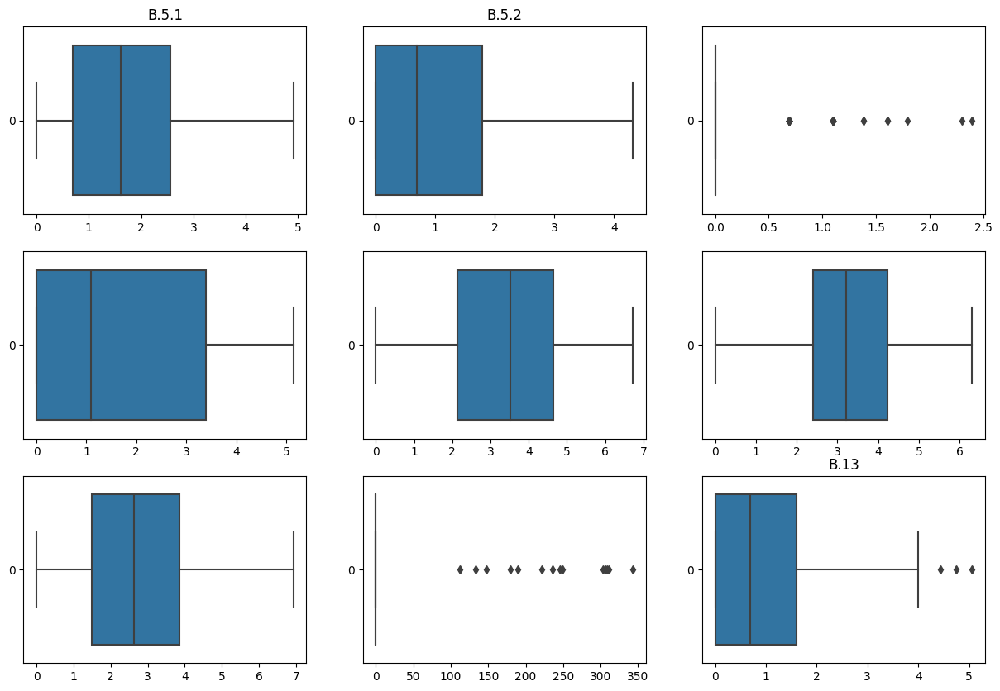

In [57]:
plt.figure(figsize=(15,10))
plt.subplot(3,3,1)
sns.boxplot(df_copya["B.5.1"],orient="horizontal")
plt.title("B.5.1")
plt.subplot(3,3,2)
sns.boxplot(df_copya["B.5.2"],orient="horizontal")
plt.title("B.5.2")
plt.subplot(3,3,3)
sns.boxplot(df_copya["B.6"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df_copya["B.7"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df_copya["B.9"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df_copya["B.10"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df_copya["B.11"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df_copya["B.12.5"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df_copya["B.13"],orient="horizontal")
plt.title("B.13")

<Axes: >

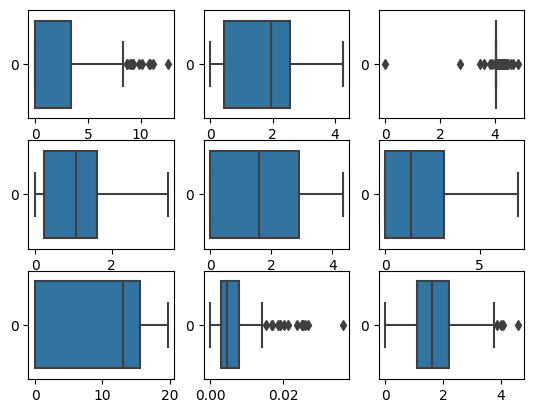

In [58]:
plt.subplot(3,3,1)
sns.boxplot(df_copya["B.14.1"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df_copya["B.15"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df_copya["B.16"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df_copya["B.17.1"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df_copya["B.17.2"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df_copya["B.18.1"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df_copya["B.18.2"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df_copya["B.19"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df_copya["C.1.1"],orient="horizontal")

<Axes: >

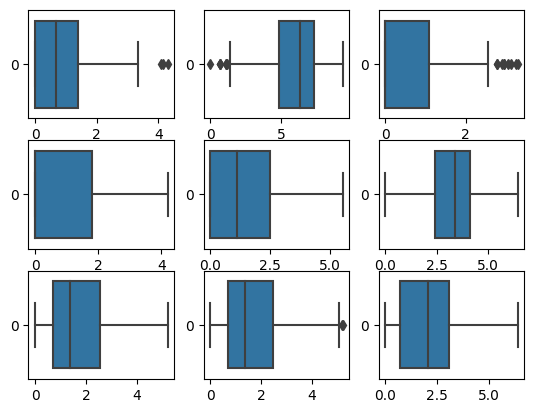

In [59]:
plt.subplot(3,3,1)
sns.boxplot(df_copya["C.1.2"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df_copya["C.2"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df_copya["C.3.1"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df_copya["C.3.2"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df_copya["C.4.1"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df_copya["C.4.2"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df_copya["C.5"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df_copya["C.6"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df_copya["D.1"],orient="horizontal")

<Axes: >

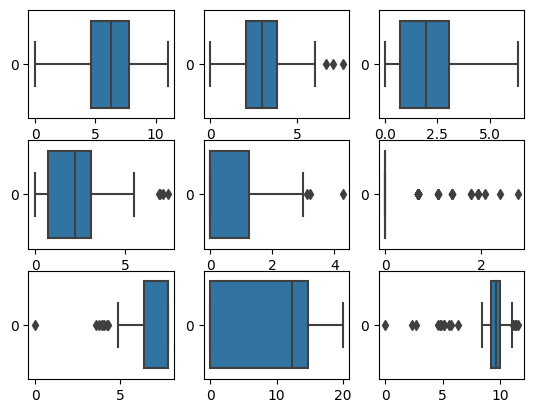

In [60]:
plt.subplot(3,3,1)
sns.boxplot(df_copya["D.2"],orient="horizontal")
plt.subplot(3,3,2)
sns.boxplot(df_copya["D.3"],orient="horizontal")
plt.subplot(3,3,3)
sns.boxplot(df_copya["D.4"],orient="horizontal")
plt.subplot(3,3,4)
sns.boxplot(df_copya["D.5.1"],orient="horizontal")
plt.subplot(3,3,5)
sns.boxplot(df_copya["D.5.2"],orient="horizontal")
plt.subplot(3,3,6)
sns.boxplot(df_copya["D.6.1"],orient="horizontal")
plt.subplot(3,3,7)
sns.boxplot(df_copya["D.6.2"],orient="horizontal")
plt.subplot(3,3,8)
sns.boxplot(df_copya["D.7"],orient="horizontal")
plt.subplot(3,3,9)
sns.boxplot(df_copya["D.8"],orient="horizontal")

# Kukla Değişken Atama İşlemi


In [7]:
df_copya_2=df_copya.copy()

In [8]:
df_copya_2=df_copya_2.set_index("Üniversite/Gosterge")

In [9]:
df_copya_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 199 entries, abdullah-gul-universitesi.pdf to zonguldak-bulent-ecevit-universitesi.pdf
Data columns (total 63 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   A.1     199 non-null    float64
 1   A.2.1   199 non-null    float64
 2   A.2.2   199 non-null    float64
 3   A.3     199 non-null    float64
 4   A.4.1   199 non-null    float64
 5   A.4.2   199 non-null    float64
 6   A.5     199 non-null    float64
 7   A.6     199 non-null    float64
 8   A.7     199 non-null    float64
 9   A.8     199 non-null    float64
 10  A.9     199 non-null    float64
 11  A.10    199 non-null    float64
 12  A.11.1  199 non-null    float64
 13  A.11.2  199 non-null    float64
 14  B.1     199 non-null    float64
 15  B.2     199 non-null    float64
 16  B.3     199 non-null    float64
 17  B.4     199 non-null    float64
 18  B.5.1   199 non-null    float64
 19  B.5.2   199 non-null    float64
 20  B.6     199 non-

In [10]:
dms=pd.get_dummies(df_copya_2[["B.12.1","B.12.2","B.12.3","B.12.4","B.12.5","B.12.7","B.12.8"]])

In [11]:
dms=dms.drop(["B.12.1_0","B.12.2_0","B.12.3_0","B.12.4_0","B.12.5_0","B.12.7_0","B.12.8_0"],axis=1)
#sıfırın olduğu durumlar atıldı.

In [12]:
dms=pd.DataFrame(dms)

In [211]:
dms

,B.12.1_1001+,B.12.1_401-600,B.12.1_601-800,B.12.1_801-1000,B.12.2_1-200,B.12.2_201-400,B.12.2_401+,B.12.3_5,B.12.3_8,B.12.3_1-201,...,B.12.4_601-800,B.12.4_801-1000,B.12.4_801-1001,B.12.5_1-200,B.12.5_201-400,B.12.7_401-600,B.12.7_601-800,B.12.7_801-1000,B.12.8_1_4,B.12.8_5_8
Üniversite/Gosterge,,,,,,,,,,,,,,,,,,,,,
abdullah-gul-universitesi.pdf,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
acibadem-mehmet-ali-aydinlar-universitesi.pdf,1,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
adana-alparslan-turkes-bilim-ve-teknoloji-universitesi.pdf,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
adiyaman-universitesi.pdf,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
afyon-kocatepe-universitesi.pdf,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yeditepe-universitesi.pdf,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
yildiz-teknik-universitesi.pdf,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
yozgat-bozok-universitesi.pdf,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
df_copya_2=df_copya_2.drop(["B.12.1","B.12.2","B.12.3","B.12.4","B.12.5","B.12.7","B.12.8"],axis=1)

In [14]:
df_copya_2=pd.concat([df_copya_2,dms],axis=1)

In [15]:
df_copya_2

,A.1,A.2.1,A.2.2,A.3,A.4.1,A.4.2,A.5,A.6,A.7,A.8,...,B.12.4_601-800,B.12.4_801-1000,B.12.4_801-1001,B.12.5_1-200,B.12.5_201-400,B.12.7_401-600,B.12.7_601-800,B.12.7_801-1000,B.12.8_1_4,B.12.8_5_8
Üniversite/Gosterge,,,,,,,,,,,,,,,,,,,,,
abdullah-gul-universitesi.pdf,1.609438,0.000000,1.386294,3.688879,2.995732,4.682131,6.216606,0.693147,0.684611,0.693147,...,0,0,0,0,0,0,0,0,0,0
acibadem-mehmet-ali-aydinlar-universitesi.pdf,2.197225,0.000000,0.000000,2.995732,3.433987,2.995732,0.000000,0.662688,0.693147,0.113329,...,0,0,0,0,0,0,0,0,0,0
adana-alparslan-turkes-bilim-ve-teknoloji-universitesi.pdf,0.000000,0.000000,0.000000,2.302585,0.693147,0.000000,3.583519,0.604316,0.693147,0.270027,...,0,0,0,0,0,0,0,0,0,0
adiyaman-universitesi.pdf,2.079442,1.386294,1.609438,0.000000,1.386294,0.693147,0.693147,0.631272,0.693147,0.672944,...,0,0,0,0,0,0,0,0,0,0
afyon-kocatepe-universitesi.pdf,3.401197,1.098612,1.609438,1.609438,1.098612,1.098612,0.000000,0.583332,0.403463,0.394067,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yeditepe-universitesi.pdf,4.477337,0.693147,1.098612,3.178054,3.583519,3.871201,3.806662,0.654926,0.009950,0.007968,...,0,0,0,0,0,0,0,0,0,0
yildiz-teknik-universitesi.pdf,5.323010,2.708050,2.772589,4.477337,6.180017,6.137727,1.248468,0.009950,0.009950,0.007968,...,0,0,0,0,1,0,0,0,0,0
yozgat-bozok-universitesi.pdf,1.945910,0.693147,0.693147,1.386294,4.430817,2.079442,0.000000,0.007968,0.006976,0.001000,...,0,0,0,0,0,0,0,0,0,0


In [101]:
df_copya_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 199 entries, abdullah-gul-universitesi.pdf to zonguldak-bulent-ecevit-universitesi.pdf
Data columns (total 79 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   A.1              199 non-null    float64
 1   A.2.1            199 non-null    float64
 2   A.2.2            199 non-null    float64
 3   A.3              199 non-null    float64
 4   A.4.1            199 non-null    float64
 5   A.4.2            199 non-null    float64
 6   A.5              199 non-null    float64
 7   A.6              199 non-null    float64
 8   A.7              199 non-null    float64
 9   A.8              199 non-null    float64
 10  A.9              199 non-null    float64
 11  A.10             199 non-null    float64
 12  A.11.1           199 non-null    float64
 13  A.11.2           199 non-null    float64
 14  B.1              199 non-null    float64
 15  B.2              199 non-null    float64
 16  B.

# Standartlaştırma

In [15]:
from sklearn import preprocessing
stand=preprocessing.scale(df_copya_2)

In [16]:
stand

array([[-0.49656793, -0.80812002,  0.68859376, ..., -0.16054032,
        -0.14322297, -0.14322297],
       [-0.16613087, -0.80812002, -0.78468957, ..., -0.16054032,
        -0.14322297, -0.14322297],
       [-1.40134847, -0.80812002, -0.78468957, ..., -0.16054032,
        -0.14322297, -0.14322297],
       ...,
       [-0.30741275, -0.03377529, -0.0480479 , ..., -0.16054032,
        -0.14322297, -0.14322297],
       [-1.40134847, -0.80812002, -0.78468957, ..., -0.16054032,
        -0.14322297, -0.14322297],
       [ 0.2827676 ,  0.74056943,  1.11950151, ..., -0.16054032,
        -0.14322297, -0.14322297]])

# K Means Yöntemi 

In [18]:
# K Sayısını belirliyoruz öncelik olarak 
from sklearn.cluster import KMeans

In [19]:
ssd = []
K= range (2,30)

In [20]:
for k in K  :
    k_means=KMeans(n_clusters=k).fit(df_copya_2)
    ssd.append(k_means.inertia_)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

In [41]:
ssd

[455055559073056.6,
 157050700543131.44,
 67872576029448.75,
 34039268356977.62,
 15304314419000.178,
 8353366890877.313,
 5356287502394.393,
 3240911437072.332,
 2085183564558.9832,
 1237770217696.2898,
 852208476457.5012,
 536167023179.31506,
 349294692184.0169,
 289036222263.98755,
 231921146470.76038,
 184180311069.33237,
 134397929276.73831,
 107517240047.04633,
 82017629740.61473,
 56445266101.90828,
 38149637992.55042,
 25394235762.302616,
 20510241979.83018,
 16267044345.091578,
 12923025612.539036,
 10526736330.435947,
 9036277934.739672,
 6826990707.915158]

Text(0.5, 1.0, 'Optimum Küme Sayısı İçin Elbow Yöntemi')

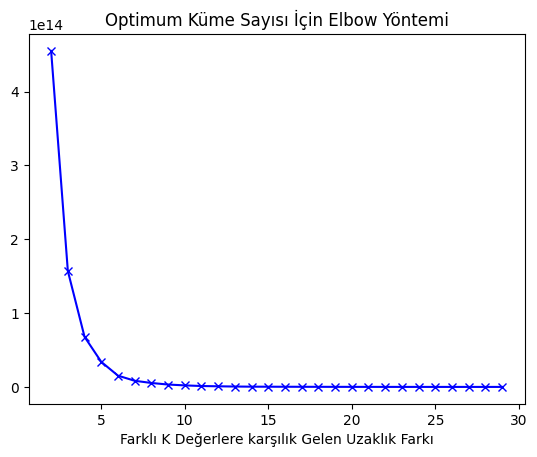

In [21]:

plt.plot(K,ssd,"bx-")
plt.xlabel("Farklı K Değerlere karşılık Gelen Uzaklık Farkı")
plt.title("Optimum Küme Sayısı İçin Elbow Yöntemi")

In [22]:
k_means_2=KMeans(n_clusters=4)
k_fit=k_means_2.fit(df_copya_2)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [23]:
k_fit.cluster_centers_

array([[ 2.31993687e+00,  6.21485079e-01,  6.24215996e-01,
         2.03002700e+00,  2.76805155e+00,  1.70211227e+00,
         1.89427995e+00,  5.07624851e-01,  4.52726719e-01,
         2.52116255e-01,  1.14819265e-01,  8.02751493e-01,
         1.82845633e+00,  3.47695466e+00,  2.04389189e-01,
         3.24933048e-01,  3.89515358e+00,  4.75963978e-01,
         1.52155985e+00,  9.41225359e-01,  1.27395312e-01,
         1.47605397e+00,  0.00000000e+00,  3.21214598e+00,
         3.06959552e+00,  2.50169751e+00,  8.13724814e-01,
         1.41953038e+00,  1.07443222e+05,  1.62383258e+00,
         4.07034927e+00,  9.75260348e-01,  1.49618895e+00,
         1.53171236e+00,  8.03696718e+00,  6.21636059e-03,
         1.49303147e+00,  7.47933336e-01,  5.79509008e+00,
         6.13478436e-01,  8.62354088e-01,  1.37261940e+00,
         3.04681254e+00,  1.41824998e+00,  1.47050588e+00,
         1.86366528e+00,  5.79601819e+00,  2.76066879e+00,
         1.85299057e+00,  1.95487120e+00,  6.48817271e-0

In [24]:
kümeler=k_means_2.labels_
merkezler=k_means_2.cluster_centers_

In [25]:
kümeler

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 1, 3, 0, 0, 0, 0, 3, 0,
       0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 3, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0])

In [ ]:
#Göreselleştirme

In [26]:
x=df_copya_2.iloc[:,0]
y=df_copya_2.iloc[:,1]

In [27]:
renk={0:"red",1:"blue",2:"green",3:"purple"}
etiket=["0","1","2","3"]

C:\Users\arsla\AppData\Local\Temp\ipykernel_42936\3370277770.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])


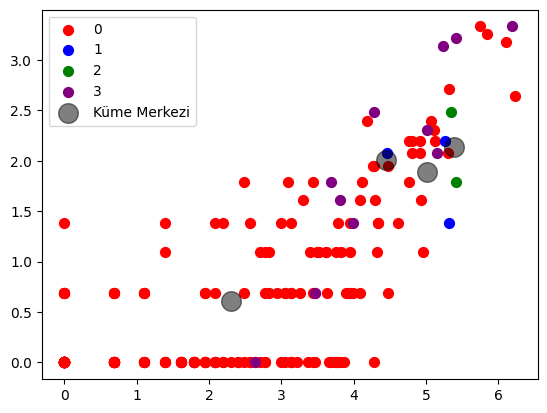

In [24]:
for küme in set(kümeler):
    plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])
    plt.legend()
plt.scatter(merkezler[:, 0], merkezler[:, 1], c="black", s=200, alpha=0.5, label="Küme Merkezi")
plt.legend()

In [28]:
K_label=k_means_2.labels_

In [29]:
from sklearn.metrics import silhouette_score

In [30]:
silhouette_score=silhouette_score(df_copya_2,K_label)

In [31]:
silhouette_score

0.9016058131722191

In [32]:
DF_Klabel=pd.DataFrame(K_label)

In [33]:
DF_Klabel=DF_Klabel.rename(columns={0:"K_Label"})

In [34]:
DF_Klabel

,K_Label
0,0
1,0
2,0
3,0
4,0
...,...
194,0
195,0
196,0
197,0


In [86]:
DF_küme=pd.DataFrame(kümeler,columns=["K_Label"])

In [67]:
Son_hal=df_copya_2.copy()

In [87]:
gosterge=pd.read_excel("Üniversite_gösterge.xlsx")

In [88]:
K_label=pd.concat([gosterge,DF_küme],axis=1)

In [89]:
K_label=K_label.set_index("Üniversite/Gosterge")

In [90]:
K_label

,K_Label
Üniversite/Gosterge,
abdullah-gul-universitesi.pdf,2
acibadem-mehmet-ali-aydinlar-universitesi.pdf,3
adana-alparslan-turkes-bilim-ve-teknoloji-universitesi.pdf,0
adiyaman-universitesi.pdf,4
afyon-kocatepe-universitesi.pdf,3
...,...
yeditepe-universitesi.pdf,1
yildiz-teknik-universitesi.pdf,1
yozgat-bozok-universitesi.pdf,3


In [91]:
Son_hal=pd.concat([Son_hal,K_label],axis=1)

In [92]:
Son_hal

,A.1,A.2.1,A.2.2,A.3,A.4.1,A.4.2,A.5,A.6,A.7,A.8,...,B.12.4_801-1001,B.12.5_1-200,B.12.5_201-400,B.12.7_401-600,B.12.7_601-800,B.12.7_801-1000,B.12.8_1_4,B.12.8_5_8,0,K_Label
Üniversite/Gosterge,,,,,,,,,,,,,,,,,,,,,
abdullah-gul-universitesi.pdf,1.609438,0.000000,1.386294,3.688879,2.995732,4.682131,6.216606,0.693147,0.684611,0.693147,...,0,0,0,0,0,0,0,0,2,2
acibadem-mehmet-ali-aydinlar-universitesi.pdf,2.197225,0.000000,0.000000,2.995732,3.433987,2.995732,0.000000,0.662688,0.693147,0.113329,...,0,0,0,0,0,0,0,0,3,3
adana-alparslan-turkes-bilim-ve-teknoloji-universitesi.pdf,0.000000,0.000000,0.000000,2.302585,0.693147,0.000000,3.583519,0.604316,0.693147,0.270027,...,0,0,0,0,0,0,0,0,0,0
adiyaman-universitesi.pdf,2.079442,1.386294,1.609438,0.000000,1.386294,0.693147,0.693147,0.631272,0.693147,0.672944,...,0,0,0,0,0,0,0,0,4,4
afyon-kocatepe-universitesi.pdf,3.401197,1.098612,1.609438,1.609438,1.098612,1.098612,0.000000,0.583332,0.403463,0.394067,...,0,0,0,0,0,0,0,0,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yeditepe-universitesi.pdf,4.477337,0.693147,1.098612,3.178054,3.583519,3.871201,3.806662,0.654926,0.009950,0.007968,...,0,0,0,0,0,0,0,0,1,1
yildiz-teknik-universitesi.pdf,5.323010,2.708050,2.772589,4.477337,6.180017,6.137727,1.248468,0.009950,0.009950,0.007968,...,0,0,1,0,0,0,0,0,1,1
yozgat-bozok-universitesi.pdf,1.945910,0.693147,0.693147,1.386294,4.430817,2.079442,0.000000,0.007968,0.006976,0.001000,...,0,0,0,0,0,0,0,0,3,3


In [420]:
Son_hal.to_excel("Yok_Karne_1007.xlsx",index=True)

# Değişken Gruplu Kümeleme

In [ ]:
# A Grubu

In [42]:
ssd_2 = []
K= range (2,30)

In [43]:
for k in K  :
    k_means=KMeans(n_clusters=k).fit(df_copya_2[["A.1","A.2.1","A.2.2","A.3","A.4.1","A.4.2","A.5","A.6","A.7","A.8","A.9","A.10","A.11.1",
                                                "A.11.2"]])
    ssd_2.append(k_means.inertia_)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

In [119]:
ssd_2

[2485.788234026014,
 2155.6424957505105,
 1949.6577136535539,
 1779.4364136923618,
 1665.8393043754977,
 1569.7878577167903,
 1485.139506824019,
 1443.3213270689148,
 1402.243856374408,
 1332.401145611351,
 1284.5047030815124,
 1253.2014661809728,
 1216.2533543949237,
 1166.193348492785,
 1142.3660055255857,
 1122.678114631327,
 1073.958281258205,
 1044.9676984231303,
 1023.4620521655494,
 994.6286459863051,
 972.2099027988622,
 955.4524929829837,
 939.8994902658997,
 920.5125036444591,
 906.9503244850646,
 883.2430247968803,
 875.005660277241,
 833.2416480683983]

Text(0.5, 1.0, 'Optimum Küme Sayısı İçin Elbow Yöntemi')

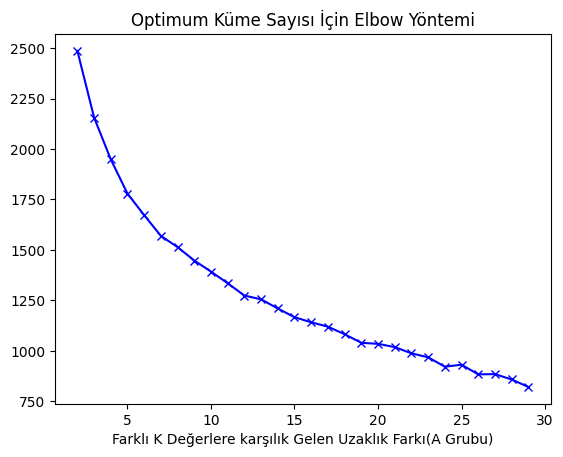

In [44]:
plt.plot(K,ssd_2,"bx-")
plt.xlabel("Farklı K Değerlere karşılık Gelen Uzaklık Farkı(A Grubu)")
plt.title("Optimum Küme Sayısı İçin Elbow Yöntemi")

In [45]:
k_means_2=KMeans(n_clusters=5)
k_fit=k_means_2.fit(df_copya_2[["A.1","A.2.1","A.2.2","A.3","A.4.1","A.4.2","A.5","A.6","A.7","A.8","A.9","A.10","A.11.1",
                                                "A.11.2"]])

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [46]:
k_fit.cluster_centers_

array([[0.45332701, 0.13273031, 0.17335888, 1.11334307, 1.87963167,
        0.48882082, 0.59136668, 0.48955111, 0.3840651 , 0.13883623,
        0.07829102, 0.13610489, 2.14364215, 4.77838336],
       [4.83049314, 2.07084279, 2.16306235, 3.65658073, 4.70569168,
        4.31572077, 4.43921437, 0.56712304, 0.42736627, 0.33742755,
        0.16364416, 2.47552249, 1.98667285, 3.06150226],
       [3.26569916, 0.50265728, 0.55206612, 2.41478985, 3.24456444,
        2.86802279, 4.64762532, 0.48412099, 0.47317958, 0.32102959,
        0.15340706, 1.22805944, 1.68419289, 3.35200673],
       [3.1444295 , 0.82043032, 0.90724183, 2.12622112, 3.05885499,
        2.25661932, 0.99303173, 0.53639829, 0.49549127, 0.34745445,
        0.13879338, 0.96670227, 1.7788198 , 3.63387767],
       [1.55863985, 0.38756754, 0.20793076, 1.88335018, 2.09288703,
        0.33941922, 0.45462731, 0.49516985, 0.49322073, 0.23386831,
        0.07918377, 0.09817931, 1.61801728, 2.22403727]])

In [47]:
kümeler=k_means_2.labels_
merkezler=k_means_2.cluster_centers_

In [48]:
kümeler

array([2, 3, 0, 4, 3, 4, 4, 1, 4, 4, 0, 3, 0, 1, 0, 3, 0, 0, 4, 1, 3, 0,
       0, 0, 0, 1, 2, 4, 2, 2, 3, 3, 3, 1, 4, 0, 2, 0, 3, 4, 4, 2, 4, 1,
       3, 3, 2, 1, 0, 2, 3, 4, 3, 0, 3, 3, 1, 2, 1, 1, 3, 4, 2, 1, 3, 0,
       1, 3, 1, 0, 1, 2, 4, 4, 1, 0, 4, 2, 2, 3, 3, 0, 4, 1, 1, 0, 4, 3,
       0, 3, 0, 2, 2, 4, 0, 3, 2, 0, 3, 4, 2, 3, 4, 2, 0, 1, 2, 4, 1, 1,
       3, 4, 0, 4, 2, 3, 0, 2, 2, 4, 4, 2, 4, 2, 3, 4, 2, 4, 0, 2, 0, 0,
       3, 2, 0, 2, 2, 4, 0, 0, 0, 2, 1, 4, 1, 0, 3, 3, 1, 0, 4, 1, 2, 3,
       2, 0, 1, 0, 1, 4, 0, 3, 1, 4, 3, 1, 4, 1, 4, 0, 0, 1, 4, 0, 0, 0,
       3, 2, 2, 0, 4, 1, 3, 0, 4, 1, 0, 3, 4, 4, 2, 2, 3, 2, 1, 1, 3, 0,
       3])

In [49]:
A_grup=df_copya_2[["A.1","A.2.1","A.2.2","A.3","A.4.1","A.4.2","A.5","A.6","A.7","A.8","A.9","A.10","A.11.1",
                                                "A.11.2"]]

In [50]:
x=A_grup.iloc[:,0]
y=A_grup.iloc[:,1]

In [51]:
renk={0:"red",1:"blue",2:"green",3:"purple",4:"pink"}
etiket=["0","1","2","3","4"]

C:\Users\arsla\AppData\Local\Temp\ipykernel_46904\3370277770.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])


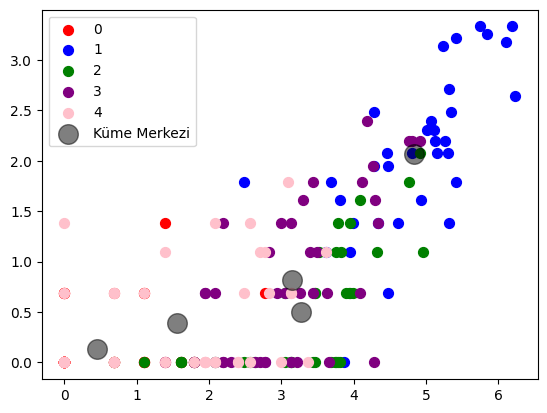

In [52]:
for küme in set(kümeler):
    plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])
    plt.legend()
plt.scatter(merkezler[:, 0], merkezler[:, 1], c="black", s=200, alpha=0.5, label="Küme Merkezi")
plt.legend()

In [126]:
K_label_2=k_means_2.labels_

In [127]:
K_label_2

array([2, 3, 0, 4, 3, 4, 4, 1, 4, 4, 0, 3, 0, 1, 0, 3, 0, 0, 4, 1, 3, 0,
       0, 0, 0, 1, 2, 4, 2, 2, 3, 3, 3, 1, 4, 0, 2, 0, 3, 4, 4, 2, 4, 1,
       3, 3, 2, 1, 0, 2, 3, 4, 3, 0, 3, 3, 1, 2, 1, 1, 3, 4, 2, 1, 3, 0,
       1, 3, 1, 0, 1, 2, 4, 4, 1, 0, 4, 2, 2, 3, 3, 0, 4, 1, 1, 0, 4, 3,
       0, 3, 0, 2, 2, 4, 0, 3, 2, 0, 3, 4, 2, 3, 4, 2, 0, 1, 2, 4, 1, 1,
       3, 4, 0, 4, 2, 3, 0, 2, 2, 4, 4, 2, 4, 2, 3, 4, 2, 4, 0, 2, 0, 0,
       3, 2, 0, 2, 2, 4, 0, 0, 0, 2, 1, 4, 1, 0, 3, 3, 1, 0, 4, 1, 2, 3,
       2, 0, 1, 0, 1, 4, 0, 3, 1, 4, 3, 1, 4, 1, 4, 0, 0, 1, 4, 0, 0, 0,
       3, 2, 2, 0, 4, 1, 3, 0, 4, 1, 0, 3, 4, 4, 2, 2, 3, 2, 1, 1, 3, 0,
       3])

In [78]:
from sklearn.metrics import silhouette_score

In [149]:
silhouette_score_2=silhouette_score(A_grup,K_label_2)

In [150]:
silhouette_score_2

0.16418174418364956

In [ ]:
# B grubu 

In [93]:
B_grubu=df_copya_2[["B.1","B.2","B.3","B.4","B.5.1","B.5.2","B.6","B.7","B.9","B.10","B.11","B.13","B.14.1","B.14.2","B.15","B.16","B.17.1","B.17.2",
                   "B.18.1","B.18.2","B.19","B.12.1_1001+","B.12.1_401-600","B.12.1_601-800","B.12.1_801-1000","B.12.2_1-200",
                   "B.12.2_201-400","B.12.2_401+","B.12.3_5","B.12.3_8","B.12.3_1-201","B.12.3_401+","B.12.4_1001+","B.12.4_401-600","B.12.4_601-800",
                   "B.12.4_801-1000","B.12.4_801-1001","B.12.5_1-200","B.12.5_201-400","B.12.7_401-600","B.12.7_601-800","B.12.7_801-1000","B.12.8_1_4","B.12.8_5_8"]]

In [94]:
ssd_3 = []
K= range (2,30)

In [95]:
for k in K  :
    k_means=KMeans(n_clusters=k).fit(B_grubu)
    ssd_3.append(k_means.inertia_)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

Text(0.5, 1.0, 'Optimum Küme Sayısı İçin Elbow Yöntemi')

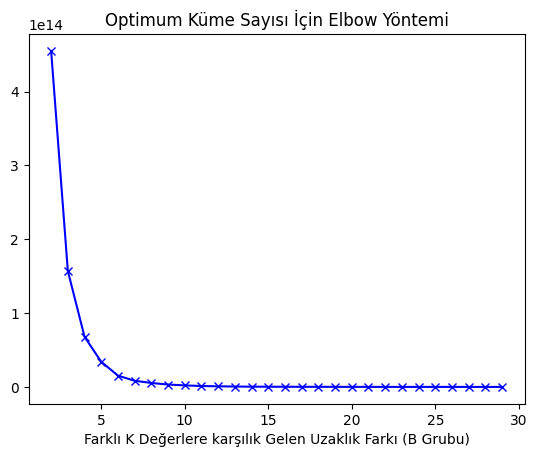

In [96]:

plt.plot(K,ssd_3,"bx-")
plt.xlabel("Farklı K Değerlere karşılık Gelen Uzaklık Farkı (B Grubu)")
plt.title("Optimum Küme Sayısı İçin Elbow Yöntemi")

In [97]:
k_means_3=KMeans(n_clusters=3)
k_fit=k_means_3.fit(B_grubu)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [121]:
K_label_3=k_means_3.labels_

In [122]:
K_label_3

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0])

In [100]:
k_fit.cluster_centers_

array([[2.01762887e-01, 3.32404207e-01, 3.97664148e+00, 4.73921707e-01,
        1.59459106e+00, 1.01359594e+00, 1.54459084e-01, 1.56815524e+00,
        3.28893506e+00, 3.15514940e+00, 2.61427388e+00, 8.93868479e-01,
        1.73222022e+00, 2.57037072e+05, 1.65456235e+00, 4.05153352e+00,
        1.04400267e+00, 1.57635599e+00, 1.68529825e+00, 8.48273216e+00,
        6.27899690e-03, 1.49484536e-01, 2.06185567e-02, 1.54639175e-02,
        1.54639175e-02, 3.09278351e-02, 5.67010309e-02, 1.13402062e-01,
        5.15463918e-03, 5.15463918e-03, 1.90721649e-01, 5.15463918e-03,
        2.06185567e-02, 1.54639175e-02, 1.03092784e-02, 5.15463918e-03,
        1.03092784e-02, 2.57731959e-02, 3.60824742e-02, 5.15463918e-03,
        1.03092784e-02, 1.54639175e-02, 2.06185567e-02, 1.03092784e-02],
       [1.46500000e-01, 4.78904402e-01, 6.38248981e+00, 4.06231480e-01,
        3.94753175e+00, 3.08165740e+00, 1.54552123e+00, 5.03082224e+00,
        6.57653164e+00, 6.06590618e+00, 6.37000066e+00, 4.32305

In [101]:
kümeler=k_means_3.labels_
merkezler=k_means_3.cluster_centers_

In [102]:
kümeler

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0])

In [175]:
x=A_grup.iloc[:,0]
y=A_grup.iloc[:,1]

In [176]:
renk={0:"red",1:"blue",2:"green"}
etiket=["0","1","2"]

C:\Users\arsla\AppData\Local\Temp\ipykernel_58584\3370277770.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])


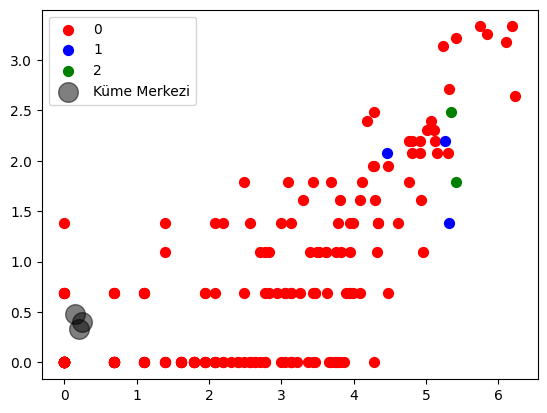

In [177]:
for küme in set(kümeler):
    plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])
    plt.legend()
plt.scatter(merkezler[:, 0], merkezler[:, 1], c="black", s=200, alpha=0.5, label="Küme Merkezi")
plt.legend()

In [178]:
from sklearn.metrics import silhouette_score

In [179]:
silhouette_score_3= silhouette_score(B_grubu,K_label_3)

In [180]:
silhouette_score_3

0.9616184514938002

In [ ]:
# C grubu 

In [132]:
C_grup=df_copya_2[["C.1.1","C.1.2","C.2","C.3.1","C.3.2","C.4.1","C.4.2","C.5","C.6"]]

In [133]:
ssd_4 = []
K= range (2,30)

In [134]:
for k in K  :
    k_means=KMeans(n_clusters=k).fit(C_grup)
    ssd_4.append(k_means.inertia_)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

Text(0.5, 1.0, 'Optimum Küme Sayısı İçin Elbow Yöntemi')

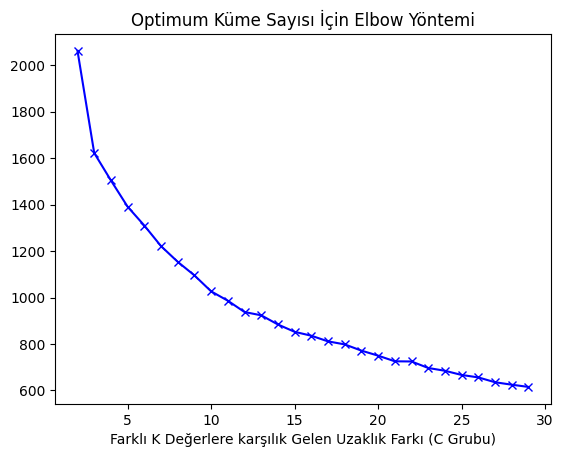

In [135]:
plt.plot(K,ssd_4,"bx-")
plt.xlabel("Farklı K Değerlere karşılık Gelen Uzaklık Farkı (C Grubu)")
plt.title("Optimum Küme Sayısı İçin Elbow Yöntemi")

In [136]:
k_means_4=KMeans(n_clusters=2)
k_fit=k_means_4.fit(C_grup)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [137]:
kümeler=k_means_4.labels_
merkezler=k_means_4.cluster_centers_

In [138]:
kümeler

array([1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0])

In [139]:
k_fit.cluster_centers_

array([[2.12220654, 1.28967521, 7.04407508, 0.99507244, 1.11813745,
        2.57900042, 4.27565882, 2.40621389, 2.4124855 ],
       [1.03502676, 0.42369305, 4.78072665, 0.29160657, 0.68926121,
        0.49300098, 2.10366065, 0.74132936, 0.86546621]])

In [140]:
from sklearn.metrics import silhouette_score 

In [142]:
K_label_4=k_means_4.labels_

In [143]:
silhouette_score_4= silhouette_score(C_grup,K_label_4)

In [144]:
silhouette_score_4

0.27868474890130185

In [201]:
x=A_grup.iloc[:,0]
y=A_grup.iloc[:,1]

In [202]:
renk={0:"red",1:"blue",2:"green"}
etiket=["0","1","2"]

C:\Users\arsla\AppData\Local\Temp\ipykernel_58584\3370277770.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])


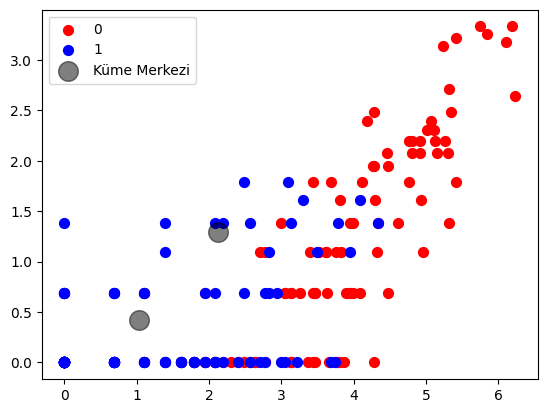

In [206]:
for küme in set(kümeler):
    plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])
    plt.legend()
plt.scatter(merkezler[:, 0], merkezler[:, 1], c="black", s=200, alpha=0.5, label="Küme Merkezi")
plt.legend()

In [101]:
# D Grubu

In [149]:
D_grup=df_copya_2[["D.1","D.2","D.3","D.4","D.5.1","D.5.2","D.6.1","D.6.2","D.7","D.8","D.9"]]

In [150]:
ssd_5 = []
K= range (2,30)

In [151]:
for k in K  :
    k_means=KMeans(n_clusters=k).fit(D_grup)
    ssd_5.append(k_means.inertia_)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

Text(0.5, 1.0, 'Optimum Küme Sayısı İçin Elbow Yöntemi')

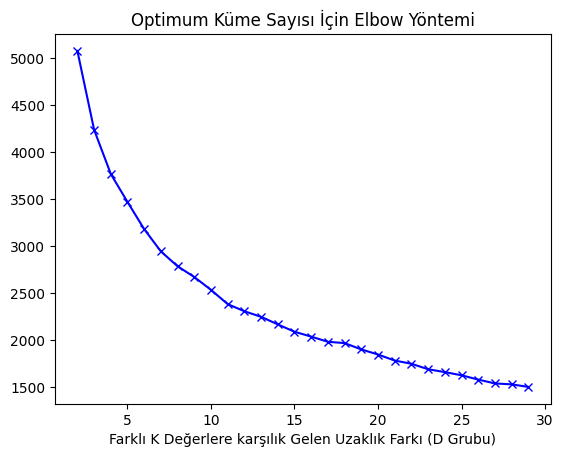

In [152]:
plt.plot(K,ssd_5,"bx-")
plt.xlabel("Farklı K Değerlere karşılık Gelen Uzaklık Farkı (D Grubu)")
plt.title("Optimum Küme Sayısı İçin Elbow Yöntemi")

In [153]:
k_means_5=KMeans(n_clusters=3)
k_fit=k_means_5.fit(C_grup)

C:\Users\arsla\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [156]:
K_label_5=k_means_5.labels_
merkezler=k_means_5.cluster_centers_

In [157]:
K_label_5

array([2, 1, 1, 2, 2, 1, 2, 0, 2, 2, 1, 2, 1, 0, 1, 1, 1, 1, 2, 0, 2, 1,
       2, 1, 2, 0, 2, 1, 2, 0, 2, 2, 2, 0, 2, 1, 2, 1, 2, 2, 2, 2, 1, 0,
       2, 2, 2, 0, 1, 0, 1, 2, 0, 1, 2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 1,
       2, 0, 0, 1, 2, 2, 2, 2, 0, 1, 2, 2, 2, 1, 1, 1, 2, 0, 2, 2, 2, 2,
       2, 2, 1, 0, 0, 2, 1, 2, 2, 1, 2, 2, 0, 0, 1, 2, 1, 0, 2, 1, 0, 0,
       2, 2, 1, 1, 0, 2, 1, 0, 0, 2, 1, 2, 1, 2, 0, 2, 2, 1, 2, 2, 2, 2,
       0, 0, 1, 2, 2, 2, 1, 1, 1, 2, 0, 2, 0, 1, 0, 2, 0, 1, 1, 0, 2, 1,
       0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 2, 0, 2, 0, 2, 1, 1, 0, 2, 1, 1, 1,
       0, 0, 1, 2, 2, 1, 2, 1, 2, 0, 2, 2, 1, 2, 2, 2, 2, 0, 0, 0, 1, 1,
       2])

In [158]:
k_fit.cluster_centers_

array([[2.23481582, 1.7778229 , 7.0484321 , 1.18433696, 1.04172495,
        3.45930643, 4.70705734, 3.24991828, 3.29008951],
       [0.88084935, 0.32970149, 3.81961928, 0.13275909, 0.33983465,
        0.39744978, 1.37044006, 0.7094198 , 0.83227682],
       [1.64983158, 0.67013429, 6.62146786, 0.66385958, 1.19424326,
        1.16445879, 3.50261822, 1.16805887, 1.21177036]])

In [159]:
from sklearn.metrics import silhouette_score

In [160]:
silhouette_score_5=silhouette_score(D_grup,K_label_5)

In [161]:
silhouette_score_5

-0.013085471133520014

In [163]:
K_label_5=pd.DataFrame(K_label_5,columns=["D grubu"])

In [165]:
K_label_5.to_excel("Dgrubu.xlsx")

In [297]:
x=A_grup.iloc[:,0]
y=A_grup.iloc[:,1]

In [298]:
renk={0:"red",1:"blue",2:"green"}
etiket=["0","1","2"]

C:\Users\arsla\AppData\Local\Temp\ipykernel_58584\3370277770.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])


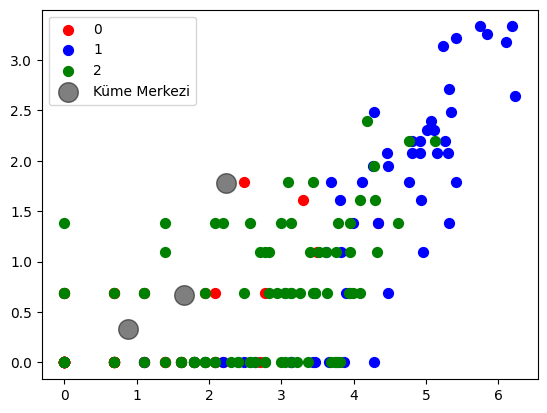

In [299]:
for küme in set(kümeler):
    plt.scatter(x[kümeler == küme], y[kümeler == küme], c=renk[küme], s=50, cmap="viridis", label=etiket[küme])
    plt.legend()
plt.scatter(merkezler[:, 0], merkezler[:, 1], c="black", s=200, alpha=0.5, label="Küme Merkezi")
plt.legend()

In [8]:
# Karşılaştırma 

Text(0.5, 0, 'Log dönüşümlü veri')

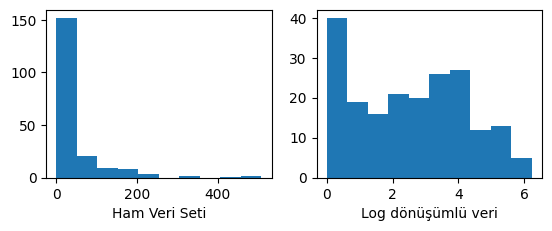

In [19]:
plt.subplot(2,2,1)
plt.hist(df["A.1"])
plt.xlabel("Ham Veri Seti")
plt.subplot(2,2,2)
plt.hist(df_copya["A.1"])
plt.xlabel("Log dönüşümlü veri")